In [ ]:
import pandas as pd
import numpy as np
from tqdm import tqdm
from sklearn import model_selection
from sklearn.metrics import accuracy_score
import xgboost as xgb
import warnings
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
import seaborn as sns

warnings.filterwarnings('ignore')

In [ ]:
!pip install optuna

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 413.4/413.4 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.4/233.4 kB 22.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 10.0 MB/s eta 0:00:00


In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Sat Mar  2 16:49:48 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   55C    P8              11W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

## FE Team data

In [ ]:
train_home_team_statistics_df = pd.read_csv('drive/MyDrive/QRT/Train_Data/train_home_team_statistics_df.csv', index_col=0)
train_away_team_statistics_df = pd.read_csv('drive/MyDrive/QRT/Train_Data/train_away_team_statistics_df.csv', index_col=0)

train_scores = pd.read_csv('drive/MyDrive/QRT/Train_Data/Y_train.csv', index_col=0)
train_scores_supp = pd.read_csv('drive/MyDrive/QRT/benchmark_and_extras/Y_train_supp.csv', index_col=0)


train_home = train_home_team_statistics_df.iloc[:,2:]
train_away = train_away_team_statistics_df.iloc[:,2:]

train_home.columns = 'HOME_' + train_home.columns
train_away.columns = 'AWAY_' + train_away.columns

train_data =  pd.concat([train_home,train_away],join='inner',axis=1)
train_scores = train_scores.loc[train_data.index]

train_data = train_data.replace({np.inf:np.nan,-np.inf:np.nan})

train_data = train_data.fillna(train_data.median())


test_home = pd.read_csv('drive/MyDrive/QRT/Test_Data/test_home_team_statistics_df.csv', index_col=0)
test_away = pd.read_csv('drive/MyDrive/QRT/Test_Data/test_away_team_statistics_df.csv', index_col=0)

test_home.columns = 'HOME_' + test_home.columns
test_away.columns = 'AWAY_' + test_away.columns

test_data =  pd.concat([test_home,test_away],join='inner',axis=1)

test_data = test_data.fillna(test_data.median())



In [ ]:
def combine_outcomes(row):
    if row['HOME_WINS'] == 1:
        return 1
    elif row['DRAW'] == 1:
        return 0
    elif row['AWAY_WINS'] == 1:
        return 2

train_scores['Outcome'] = train_scores.apply(combine_outcomes, axis=1)
train_new_y = train_scores['Outcome']

### Viz

In [ ]:

def summarize_dataframe(df):
    summary_df = pd.DataFrame(df.dtypes, columns=['dtypes'])
    summary_df['missing#'] = df.isna().sum().values*100
    summary_df['missing%'] = (df.isna().sum().values*100)/len(df)
    summary_df['uniques'] = df.nunique().values
    summary_df['first_value'] = df.iloc[0].values
    summary_df['last_value'] = df.iloc[len(df)-1].values
    summary_df['count'] = df.count().values
    #sum['skew'] = df.skew().values
    desc = pd.DataFrame(df.describe().T)
    summary_df['min'] = desc['min']
    summary_df['max'] = desc['max']
    summary_df['mean'] = desc['mean']
    return summary_df

summarize_dataframe(train_home).style.background_gradient(cmap='Blues')


,dtypes,missing#,missing%,uniques,first_value,last_value,count,min,max,mean
HOME_TEAM_SHOTS_TOTAL_season_sum,float64,26000,2.113306,11,3.000000,2.000000,12043,0.000000,10.000000,4.391182
HOME_TEAM_SHOTS_INSIDEBOX_season_sum,float64,138500,11.257417,11,2.000000,3.000000,10918,0.000000,10.000000,4.299872
HOME_TEAM_SHOTS_OFF_TARGET_season_sum,float64,0,0.000000,11,5.000000,1.000000,12303,0.000000,10.000000,4.511339
HOME_TEAM_SHOTS_ON_TARGET_season_sum,float64,200,0.016256,11,2.000000,2.000000,12301,0.000000,10.000000,4.150882
HOME_TEAM_SHOTS_OUTSIDEBOX_season_sum,float64,138700,11.273673,11,1.000000,2.000000,10916,0.000000,10.000000,4.524643
HOME_TEAM_PASSES_season_sum,float64,141300,11.485004,11,2.000000,3.000000,10890,0.000000,10.000000,4.350597
HOME_TEAM_SUCCESSFUL_PASSES_season_sum,float64,138400,11.249289,11,2.000000,4.000000,10919,0.000000,10.000000,4.130049
HOME_TEAM_SAVES_season_sum,float64,78000,6.339917,11,5.000000,7.000000,11523,0.000000,10.000000,4.674043
HOME_TEAM_CORNERS_season_sum,float64,100,0.008128,11,3.000000,4.000000,12302,0.000000,10.000000,4.505284
HOME_TEAM_FOULS_season_sum,float64,75700,6.152971,11,6.000000,0.000000,11546,0.000000,10.000000,5.135718


<Axes: >

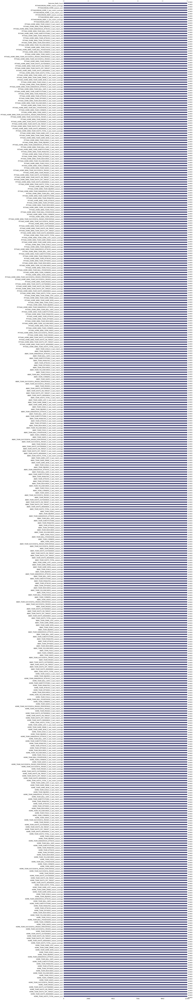

In [ ]:
import missingno as msno
msno.bar(train_home, color=(0.3,0.3,0.5))

In [ ]:
train_home.columns

Index(['HOME_TEAM_SHOTS_TOTAL_season_sum',
       'HOME_TEAM_SHOTS_INSIDEBOX_season_sum',
       'HOME_TEAM_SHOTS_OFF_TARGET_season_sum',
       'HOME_TEAM_SHOTS_ON_TARGET_season_sum',
       'HOME_TEAM_SHOTS_OUTSIDEBOX_season_sum', 'HOME_TEAM_PASSES_season_sum',
       'HOME_TEAM_SUCCESSFUL_PASSES_season_sum', 'HOME_TEAM_SAVES_season_sum',
       'HOME_TEAM_CORNERS_season_sum', 'HOME_TEAM_FOULS_season_sum',
       ...
       'HOME_TEAM_YELLOWCARDS_5_last_match_std',
       'HOME_TEAM_REDCARDS_5_last_match_std',
       'HOME_TEAM_OFFSIDES_5_last_match_std',
       'HOME_TEAM_ATTACKS_5_last_match_std',
       'HOME_TEAM_PENALTIES_5_last_match_std',
       'HOME_TEAM_SUBSTITUTIONS_5_last_match_std',
       'HOME_TEAM_BALL_SAFE_5_last_match_std',
       'HOME_TEAM_DANGEROUS_ATTACKS_5_last_match_std',
       'HOME_TEAM_INJURIES_5_last_match_std',
       'HOME_TEAM_GOALS_5_last_match_std'],
      dtype='object', length=140)

#### Correlation between features

In [ ]:

# sns.set_theme(style="white")

# d = train_home.copy()
# # d = d[['HOME_TEAM_SHOTS_TOTAL_season_sum',
# #        'HOME_TEAM_SHOTS_INSIDEBOX_season_sum',
# #        'HOME_TEAM_SHOTS_OFF_TARGET_season_sum',
# #        'HOME_TEAM_SHOTS_ON_TARGET_season_sum',
# #        'HOME_TEAM_SHOTS_OUTSIDEBOX_season_sum', 'HOME_TEAM_PASSES_season_sum',
# #        'HOME_TEAM_SUCCESSFUL_PASSES_season_sum']]
# # d = d.drop(
# #     columns=['HOME_TEAM_SHOTS_TOTAL_season_sum',
# #        'HOME_TEAM_SHOTS_INSIDEBOX_season_sum',
# #        'HOME_TEAM_SHOTS_OFF_TARGET_season_sum',
# #        'HOME_TEAM_SHOTS_ON_TARGET_season_sum',
# #        'HOME_TEAM_SHOTS_OUTSIDEBOX_season_sum', 'HOME_TEAM_PASSES_season_sum',
# #        'HOME_TEAM_SUCCESSFUL_PASSES_season_sum'
# #             ]
# # )

# corr = d.corr()

# d.fillna(0, inplace=True)

# mask = np.triu(np.ones_like(corr, dtype=bool))

# f, ax = plt.subplots(figsize=(15, 12))

# cmap = sns.diverging_palette(230, 20, as_cmap=True)

# sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0, annot=False,
#             square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [ ]:
import sweetviz
train_data_all = pd.concat([train_home, train_scores['Outcome']], axis=1)

my_report = sweetviz.compare([train_data_all, "Train"], [test_home, "Test"], "Outcome")

KeyError: 'Outcome'

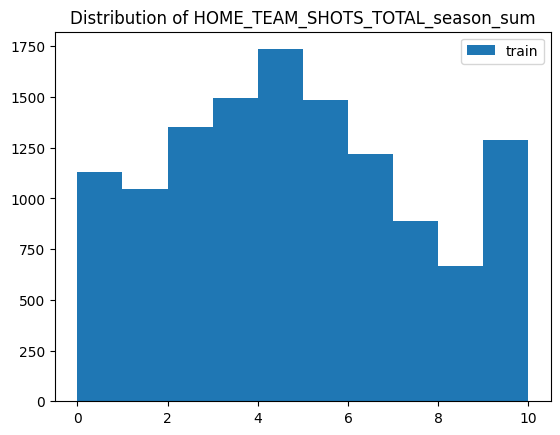

In [ ]:
plt.hist(train_data['HOME_TEAM_SHOTS_TOTAL_season_sum'], label='train');
plt.legend();
plt.title('Distribution of HOME_TEAM_SHOTS_TOTAL_season_sum');

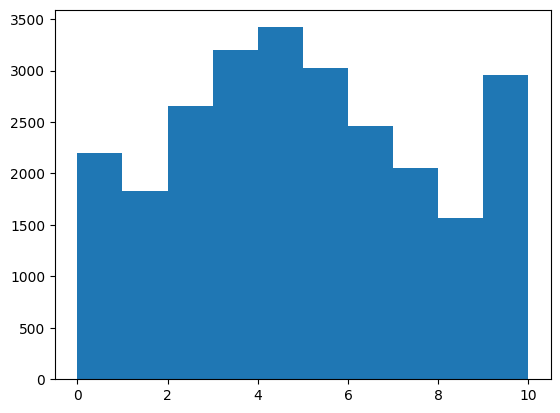

In [ ]:
plt.hist(test_data['HOME_TEAM_SHOTS_TOTAL_season_sum'], label='test');


In [ ]:
train_data.columns[140:160]

Index(['AWAY_TEAM_SHOTS_TOTAL_season_sum',
       'AWAY_TEAM_SHOTS_INSIDEBOX_season_sum',
       'AWAY_TEAM_SHOTS_OFF_TARGET_season_sum',
       'AWAY_TEAM_SHOTS_ON_TARGET_season_sum',
       'AWAY_TEAM_SHOTS_OUTSIDEBOX_season_sum', 'AWAY_TEAM_PASSES_season_sum',
       'AWAY_TEAM_SUCCESSFUL_PASSES_season_sum', 'AWAY_TEAM_SAVES_season_sum',
       'AWAY_TEAM_CORNERS_season_sum', 'AWAY_TEAM_FOULS_season_sum',
       'AWAY_TEAM_YELLOWCARDS_season_sum', 'AWAY_TEAM_REDCARDS_season_sum',
       'AWAY_TEAM_OFFSIDES_season_sum', 'AWAY_TEAM_ATTACKS_season_sum',
       'AWAY_TEAM_PENALTIES_season_sum', 'AWAY_TEAM_SUBSTITUTIONS_season_sum',
       'AWAY_TEAM_BALL_SAFE_season_sum',
       'AWAY_TEAM_DANGEROUS_ATTACKS_season_sum',
       'AWAY_TEAM_INJURIES_season_sum', 'AWAY_TEAM_GOALS_season_sum'],
      dtype='object')

In [ ]:
train_data_all = pd.concat([pythagorean_train_small, train_scores['HOME_WINS']], axis=1)
train_data_all

,PYTHAGOREAN_5_last_match_sum,PYTHAGOREAN_5_last_match_average,PYTHAGOREAN_season_sum,PYTHAGOREAN_season_average,HOME_WINS
ID,,,,,
0,1.248355e-01,1.248355e-01,0.078438,0.085360,0
1,9.999999e-01,9.999999e-01,0.902472,0.881246,0
2,3.369013e-01,3.369013e-01,0.097528,0.118754,0
3,9.999999e-01,9.999999e-01,0.999999,0.999999,1
4,2.092724e-01,2.092724e-01,0.322640,0.243873,0
...,...,...,...,...,...
12298,1.248355e-01,1.248355e-01,0.078438,0.085360,0
12299,4.329063e-01,4.329063e-01,0.128177,0.136402,0
12300,5.495402e-08,5.495402e-08,0.184925,0.193429,0


In [ ]:
train_data_all.columns

Index(['PYTHAGOREAN_5_last_match_sum', 'PYTHAGOREAN_5_last_match_average',
       'PYTHAGOREAN_season_sum', 'PYTHAGOREAN_season_average', 'Outcome'],
      dtype='object')

In [ ]:
p=12.4
train_data_all['PYTH_HOME'] = (train_data_all['HOME_TEAM_GAME_WON_5_last_match_sum'] ** p) / ((train_data_all['HOME_TEAM_GAME_WON_5_last_match_sum'] ** p) + (train_data_all['HOME_TEAM_GAME_LOST_5_last_match_sum'] ** p))

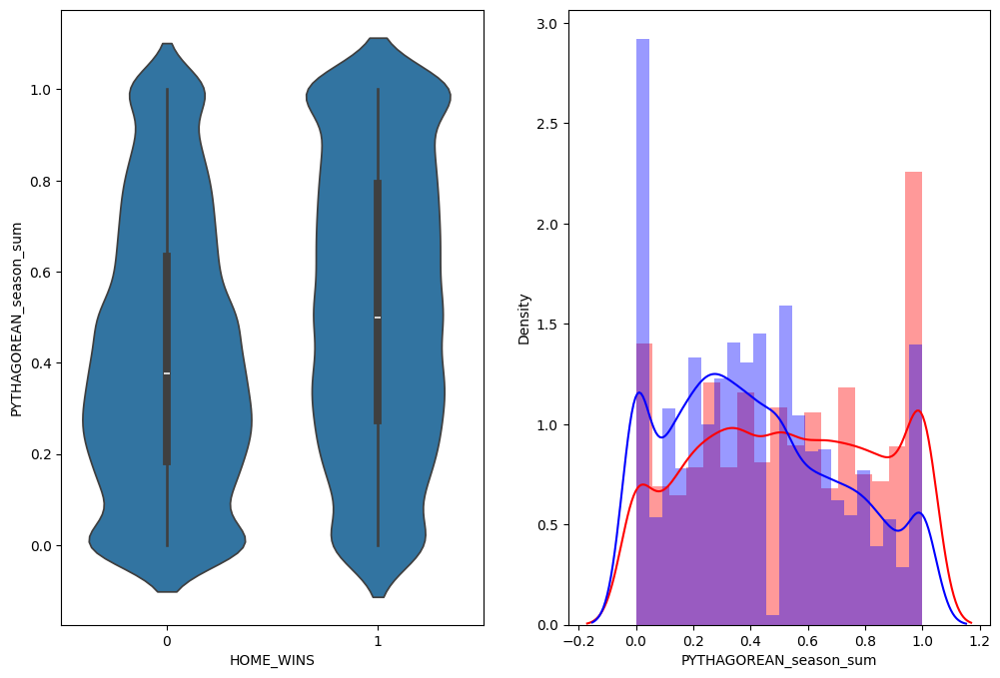

In [ ]:
import seaborn as sns

plt.figure(figsize=(12, 8))
feat = "PYTHAGOREAN_season_sum"
plt.subplot(1,2,1)
sns.violinplot(x = 'HOME_WINS', y = feat, data = train_data_all[0:])

plt.subplot(1,2,2)
sns.distplot(train_data_all[train_data_all['HOME_WINS'] == 1.0][feat][0:] , label = "1", color = 'red')
sns.distplot(train_data_all[train_data_all['HOME_WINS'] == 0.0][feat][0:] , label = "0" , color = 'blue' )
sns.distplot(train_data_all[train_data_all['HOME_WINS'] == 2.0][feat][0:] , label = "2" , color = 'yellow' )

plt.show()

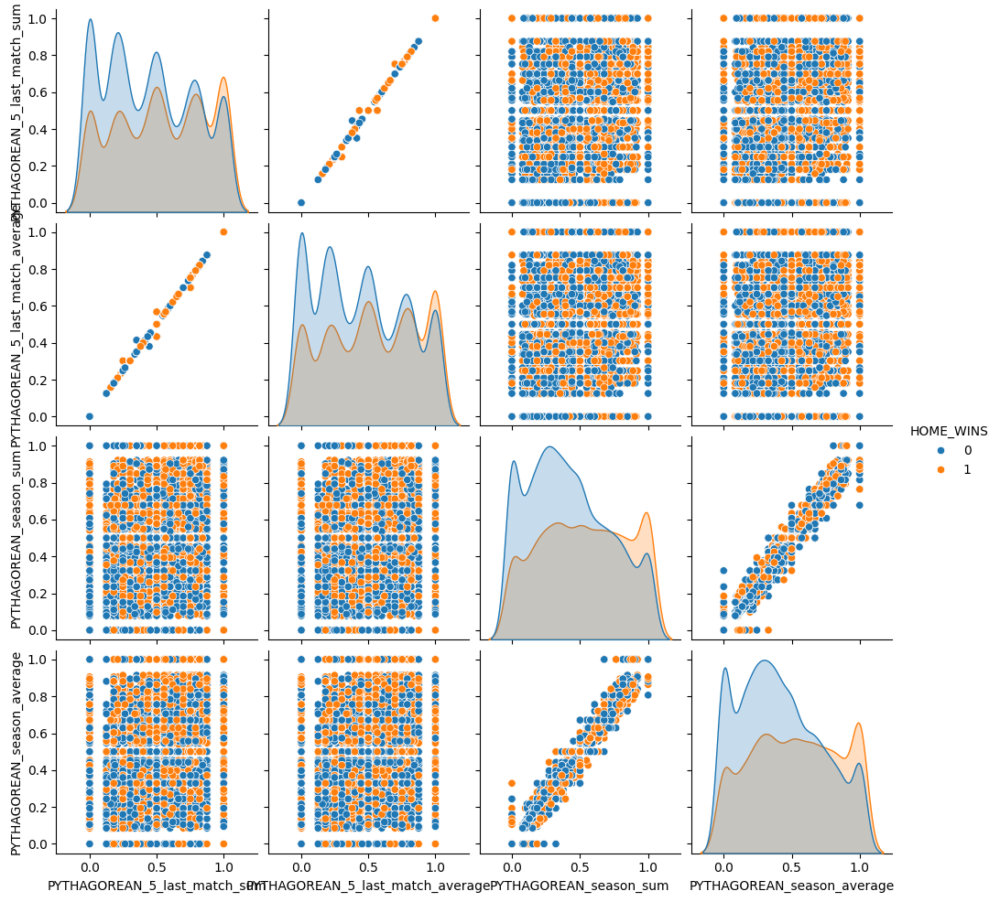

In [ ]:
n = train_data_all.shape[0]
sns.pairplot(train_data_all[['PYTHAGOREAN_5_last_match_sum', 'PYTHAGOREAN_5_last_match_average',
       'PYTHAGOREAN_season_sum', 'PYTHAGOREAN_season_average', 'HOME_WINS']][0:n], hue='HOME_WINS', vars=['PYTHAGOREAN_5_last_match_sum', 'PYTHAGOREAN_5_last_match_average',
       'PYTHAGOREAN_season_sum', 'PYTHAGOREAN_season_average'])
plt.show()

### Preprocessing

In [ ]:
def add_missing_indicators(df, missing_threshold=0.01, consider_columns=None):
    if consider_columns is None:
        consider_columns = df.columns

    missing_stats = df[consider_columns].isna().mean()
    features_with_lots_of_nans = missing_stats[missing_stats > missing_threshold].index.tolist()
    print(features_with_lots_of_nans)
    for feature in features_with_lots_of_nans:
        indicator_feature_name = f"{feature}_is_nan"
        df[indicator_feature_name] = df[feature].isna().astype(int)
    return df

def process_dataframe(df):
    selected_features = df.columns[2:]
    df['Selected_NaN_Count'] = df[selected_features].isna().sum(axis=1)

    df_columns = df.iloc[:,2:].columns.to_list()
    for feat in df_columns:
        df[feat] = df.groupby('TEAM_NAME')[feat].transform(lambda x: x.fillna(x.mode().iloc[0] if not x.mode().empty else x.mean()))

    df.iloc[:, 2:] = df.iloc[:, 2:].fillna(
        df.iloc[:, 2:].mean()
    )

    return df

In [ ]:
train_home_team_statistics_df = add_missing_indicators(train_home_team_statistics_df, missing_threshold=0.1)
train_home_team_statistics_df = process_dataframe(train_home_team_statistics_df)


train_away_team_statistics_df = add_missing_indicators(train_away_team_statistics_df, missing_threshold=0.1)
train_away_team_statistics_df = process_dataframe(train_away_team_statistics_df)

## Pythagorean Feat

### Home WON vs LOST

In [ ]:
def optimize_p(home_values, away_values, target, p_values):
    best_p = None
    best_corr = 0
    for p in p_values:
        pythagorean_feature = calculate_pythagorean_feature(home_values, away_values, p)
        corr, _ = pearsonr(pythagorean_feature, target)
        if abs(corr) > abs(best_corr):
            best_corr = abs(corr)
            best_p = p
    return best_p, best_corr

def calculate_pythagorean_feature(home_values, away_values, p):
    epsilon = 1e-5
    pythagorean_feature = (home_values + epsilon) ** p / ((home_values + epsilon) ** p + (away_values + epsilon) ** p)
    return np.nan_to_num(pythagorean_feature, nan=0.0, posinf=0.0, neginf=0.0)


feature_pairs = [
    ('HOME_TEAM_GAME_WON_5_last_match_sum', 'HOME_TEAM_GAME_LOST_5_last_match_sum'),
    ('HOME_TEAM_GAME_WON_5_last_match_average', 'HOME_TEAM_GAME_LOST_5_last_match_average'),
    ('HOME_TEAM_GAME_WON_season_sum', 'HOME_TEAM_GAME_LOST_season_sum'),
    ('HOME_TEAM_GAME_WON_season_average', 'HOME_TEAM_GAME_LOST_season_average')
]

target = train_scores['HOME_WINS']
p_values = np.arange(1.01, 6.01, 0.01)

pythagorean_train_small_home = pd.DataFrame(index=train_data.index)

optimal_p_values = {}

for home_feat, away_feat in feature_pairs:
    home_values = train_data[home_feat]
    away_values = train_data[away_feat]

    best_p, best_corr = optimize_p(home_values, away_values, target, p_values)
    optimal_p_values[home_feat] = best_p

    pythagorean_feature = calculate_pythagorean_feature(home_values, away_values, best_p)

    new_feature_name = f"PYTHAGOREAN_HOME_{home_feat.replace('HOME_TEAM_GAME_WON_', '')}"
    pythagorean_train_small_home[new_feature_name] = pythagorean_feature

    print(f"Best p for {home_feat} vs. {away_feat}: {best_p} (Correlation: {best_corr})")


Best p for HOME_TEAM_GAME_WON_5_last_match_sum vs. HOME_TEAM_GAME_LOST_5_last_match_sum: 1.2100000000000002 (Correlation: 0.13278226881740504)
Best p for HOME_TEAM_GAME_WON_5_last_match_average vs. HOME_TEAM_GAME_LOST_5_last_match_average: 1.2100000000000002 (Correlation: 0.1327359645685694)
Best p for HOME_TEAM_GAME_WON_season_sum vs. HOME_TEAM_GAME_LOST_season_sum: 1.07 (Correlation: 0.17784541314885682)
Best p for HOME_TEAM_GAME_WON_season_average vs. HOME_TEAM_GAME_LOST_season_average: 1.04 (Correlation: 0.17513851361483349)


In [ ]:
pythagorean_test_small_home = pd.DataFrame(index=test_data.index)

for home_feat, away_feat in feature_pairs:
    home_values = test_data[home_feat]
    away_values = test_data[away_feat]
    best_p = optimal_p_values[home_feat]

    pythagorean_feature = calculate_pythagorean_feature(home_values, away_values, best_p)

    new_feature_name = f"PYTHAGOREAN_HOME_{home_feat.replace('HOME_TEAM_GAME_WON_', '')}"
    pythagorean_test_small_home[new_feature_name] = pythagorean_feature

In [ ]:
pythagorean_test_small_home

,PYTHAGOREAN_HOME_5_last_match_sum,PYTHAGOREAN_HOME_5_last_match_average,PYTHAGOREAN_HOME_season_sum,PYTHAGOREAN_HOME_season_average
ID,,,,
12303,5.495402e-08,5.495402e-08,3.801888e-07,6.606923e-07
12304,6.497857e-01,6.497857e-01,5.000000e-01,5.000000e-01
12305,8.199249e-01,8.199249e-01,9.999996e-01,9.999993e-01
12306,4.450704e-01,4.450704e-01,9.215616e-01,9.146400e-01
12307,9.999999e-01,9.999999e-01,3.666578e-01,4.264594e-01
...,...,...,...,...
37666,5.000000e-01,5.000000e-01,9.999995e-01,9.999990e-01
37667,7.518882e-01,7.518882e-01,5.000000e-01,5.572077e-01
37668,9.999999e-01,9.999999e-01,6.773600e-01,6.712711e-01


### AWAY WON vs LOST

In [ ]:
feature_pairs = [
    ('AWAY_TEAM_GAME_WON_5_last_match_sum', 'AWAY_TEAM_GAME_LOST_5_last_match_sum'),
    ('AWAY_TEAM_GAME_WON_5_last_match_average', 'AWAY_TEAM_GAME_LOST_5_last_match_average'),
    ('AWAY_TEAM_GAME_WON_season_sum', 'AWAY_TEAM_GAME_LOST_season_sum'),
    ('AWAY_TEAM_GAME_WON_season_average', 'AWAY_TEAM_GAME_LOST_season_average')
]

target = train_scores['AWAY_WINS']
p_values = np.arange(1.01, 6.01, 0.01)

pythagorean_train_small_away = pd.DataFrame(index=train_data.index)

optimal_p_values = {}

for home_feat, away_feat in feature_pairs:
    home_values = train_data[home_feat]
    away_values = train_data[away_feat]

    best_p, best_corr = optimize_p(home_values, away_values, target, p_values)
    optimal_p_values[home_feat] = best_p

    pythagorean_feature = calculate_pythagorean_feature(home_values, away_values, best_p)

    new_feature_name = f"PYTHAGOREAN_AWAY_{home_feat.replace('AWAY_TEAM_GAME_WON_', '')}"
    pythagorean_train_small_away[new_feature_name] = pythagorean_feature

    print(f"Best p for {home_feat} vs. {away_feat}: {best_p} (Correlation: {best_corr})")

Best p for AWAY_TEAM_GAME_WON_5_last_match_sum vs. AWAY_TEAM_GAME_LOST_5_last_match_sum: 1.06 (Correlation: 0.11046895010787684)
Best p for AWAY_TEAM_GAME_WON_5_last_match_average vs. AWAY_TEAM_GAME_LOST_5_last_match_average: 1.05 (Correlation: 0.11026552171547545)
Best p for AWAY_TEAM_GAME_WON_season_sum vs. AWAY_TEAM_GAME_LOST_season_sum: 1.07 (Correlation: 0.1620987390308308)
Best p for AWAY_TEAM_GAME_WON_season_average vs. AWAY_TEAM_GAME_LOST_season_average: 1.1500000000000001 (Correlation: 0.16203069268807865)


In [ ]:
pythagorean_test_small_away = pd.DataFrame(index=test_data.index)

for home_feat, away_feat in feature_pairs:
    home_values = test_data[home_feat]
    away_values = test_data[away_feat]
    best_p = optimal_p_values[home_feat]

    pythagorean_feature = calculate_pythagorean_feature(home_values, away_values, best_p)

    new_feature_name = f"PYTHAGOREAN_AWAY_{home_feat.replace('AWAY_TEAM_GAME_WON_', '')}"
    pythagorean_test_small_away[new_feature_name] = pythagorean_feature

### Pyth HOME WINS

In [ ]:
def optimize_p(home_feat, away_feat, target, p_values):
    best_p = None
    best_corr = 0

    for p in p_values:
        epsilon = 1e-5
        home_values = train_data[home_feat] + epsilon
        away_values = train_data[away_feat] + epsilon

        pythagorean_feature = (home_values ** p) / ((home_values ** p) + (away_values ** p))
        # pythagorean_feature = (home_values ** p)

        pythagorean_feature = np.nan_to_num(pythagorean_feature, nan=0.0, posinf=0.0, neginf=0.0)

        corr, _ = pearsonr(pythagorean_feature, target)

        if abs(corr) > abs(best_corr):
            best_corr = abs(corr)
            best_p = p

    return best_p, best_corr

p_values = np.arange(1.01, 6.01, 0.01)
optimal_p_values_home_wins = {}
optimal_corr = 0
for home_feat, away_feat in zip(train_home.columns, train_away.columns):
    best_p, best_corr = optimize_p(home_feat, away_feat, train_scores['HOME_WINS'], p_values)
    print(f"Best p for {home_feat} vs. {away_feat}: {best_p} (Correlation: {best_corr})")
    optimal_p_values_home_wins[home_feat] = best_p
    optimal_corr += best_corr

Best p for HOME_TEAM_SHOTS_TOTAL_season_sum vs. AWAY_TEAM_SHOTS_TOTAL_season_sum: 2.6800000000000015 (Correlation: 0.20841606325159484)
Best p for HOME_TEAM_SHOTS_INSIDEBOX_season_sum vs. AWAY_TEAM_SHOTS_INSIDEBOX_season_sum: 2.1900000000000013 (Correlation: 0.2279969492011982)
Best p for HOME_TEAM_SHOTS_OFF_TARGET_season_sum vs. AWAY_TEAM_SHOTS_OFF_TARGET_season_sum: 2.410000000000001 (Correlation: 0.15428541059958048)
Best p for HOME_TEAM_SHOTS_ON_TARGET_season_sum vs. AWAY_TEAM_SHOTS_ON_TARGET_season_sum: 2.5200000000000014 (Correlation: 0.2195504056225031)
Best p for HOME_TEAM_SHOTS_OUTSIDEBOX_season_sum vs. AWAY_TEAM_SHOTS_OUTSIDEBOX_season_sum: 1.8200000000000007 (Correlation: 0.08830948857298306)
Best p for HOME_TEAM_PASSES_season_sum vs. AWAY_TEAM_PASSES_season_sum: 2.7200000000000015 (Correlation: 0.18309392229717392)
Best p for HOME_TEAM_SUCCESSFUL_PASSES_season_sum vs. AWAY_TEAM_SUCCESSFUL_PASSES_season_sum: 3.070000000000002 (Correlation: 0.18543377702493774)
Best p for HOM

In [ ]:
def calculate_pythagorean_feature(home_values, away_values, p):
    epsilon = 1e-5
    pythagorean_feature = (home_values + epsilon) ** p / ((home_values + epsilon) ** p + (away_values + epsilon) ** p)
    return np.nan_to_num(pythagorean_feature, nan=0.0, posinf=0.0, neginf=0.0)

pythagorean_train_df_home_wins = pd.DataFrame(index=train_data.index)

for home_feat, away_feat in zip(train_home.columns, train_away.columns):
    home_values = train_data[home_feat]
    away_values = train_data[away_feat]
    best_p = optimal_p_values_home_wins[home_feat]

    pythagorean_feature = calculate_pythagorean_feature(home_values, away_values, best_p)

    new_feature_name = f"PYTHAG_HOME_WINS_{home_feat.replace('HOME_', '')}"
    pythagorean_train_df_home_wins[new_feature_name] = pythagorean_feature





```
# Ce texte est au format code
```



In [ ]:
pythagorean_test_df_home_wins = pd.DataFrame(index=test_data.index)

for home_feat, away_feat in zip(test_home.columns, test_away.columns):
    home_values = test_data[home_feat]
    away_values = test_data[away_feat]
    best_p = optimal_p_values_home_wins[home_feat]

    pythagorean_feature = calculate_pythagorean_feature(home_values, away_values, best_p)

    new_feature_name = f"PYTHAG_HOME_WINS_{home_feat.replace('HOME_', '')}"
    pythagorean_test_df_home_wins[new_feature_name] = pythagorean_feature



### Pyth AWAY WINS

In [ ]:
def optimize_p(home_feat, away_feat, target, p_values):
    best_p = None
    best_corr = 0

    for p in p_values:
        epsilon = 1e-5
        home_values = train_data[home_feat] + epsilon
        away_values = train_data[away_feat] + epsilon

        pythagorean_feature = (away_values ** p) / ((away_values ** p) + (home_values ** p))
        # pythagorean_feature = (home_values ** p)

        pythagorean_feature = np.nan_to_num(pythagorean_feature, nan=0.0, posinf=0.0, neginf=0.0)

        corr, _ = pearsonr(pythagorean_feature, target)

        if abs(corr) > abs(best_corr):
            best_corr = abs(corr)
            best_p = p

    return best_p, best_corr

p_values = np.arange(1.01, 6.01, 0.01)
optimal_p_values_home_wins = {}
optimal_corr = 0
for home_feat, away_feat in zip(train_home.columns, train_away.columns):
    best_p, best_corr = optimize_p(home_feat, away_feat, train_scores['AWAY_WINS'], p_values)
    print(f"Best p for {home_feat} vs. {away_feat}: {best_p} (Correlation: {best_corr})")
    optimal_p_values_home_wins[home_feat] = best_p
    optimal_corr += best_corr

Best p for HOME_TEAM_SHOTS_TOTAL_season_sum vs. AWAY_TEAM_SHOTS_TOTAL_season_sum: 2.320000000000001 (Correlation: 0.1941492474794079)
Best p for HOME_TEAM_SHOTS_INSIDEBOX_season_sum vs. AWAY_TEAM_SHOTS_INSIDEBOX_season_sum: 2.030000000000001 (Correlation: 0.20513551532417093)
Best p for HOME_TEAM_SHOTS_OFF_TARGET_season_sum vs. AWAY_TEAM_SHOTS_OFF_TARGET_season_sum: 2.6500000000000012 (Correlation: 0.15307972476360288)
Best p for HOME_TEAM_SHOTS_ON_TARGET_season_sum vs. AWAY_TEAM_SHOTS_ON_TARGET_season_sum: 2.530000000000001 (Correlation: 0.20009997207990377)
Best p for HOME_TEAM_SHOTS_OUTSIDEBOX_season_sum vs. AWAY_TEAM_SHOTS_OUTSIDEBOX_season_sum: 1.7200000000000006 (Correlation: 0.08896549721735665)
Best p for HOME_TEAM_PASSES_season_sum vs. AWAY_TEAM_PASSES_season_sum: 3.280000000000002 (Correlation: 0.17627180661339692)
Best p for HOME_TEAM_SUCCESSFUL_PASSES_season_sum vs. AWAY_TEAM_SUCCESSFUL_PASSES_season_sum: 3.1300000000000017 (Correlation: 0.17736446696505476)
Best p for HOME

In [ ]:
def calculate_pythagorean_feature(home_values, away_values, p):
    epsilon = 1e-5
    pythagorean_feature = (away_values + epsilon) ** p / ((away_values + epsilon) ** p + (home_values + epsilon) ** p)
    return np.nan_to_num(pythagorean_feature, nan=0.0, posinf=0.0, neginf=0.0)

pythagorean_train_df_away_wins = pd.DataFrame(index=train_data.index)

for home_feat, away_feat in zip(train_home.columns, train_away.columns):
    home_values = train_data[home_feat]
    away_values = train_data[away_feat]
    best_p = optimal_p_values_home_wins[home_feat]

    pythagorean_feature = calculate_pythagorean_feature(home_values, away_values, best_p)

    new_feature_name = f"PYTHAG_AWAY_WINS_{home_feat.replace('HOME_', '')}"
    pythagorean_train_df_away_wins[new_feature_name] = pythagorean_feature



In [ ]:
pythagorean_test_df_away_wins = pd.DataFrame(index=test_data.index)

for home_feat, away_feat in zip(test_home.columns, test_away.columns):
    home_values = test_data[home_feat]
    away_values = test_data[away_feat]
    best_p = optimal_p_values_home_wins[home_feat]

    pythagorean_feature = calculate_pythagorean_feature(home_values, away_values, best_p)

    new_feature_name = f"PYTHAG_AWAY_WINS_{home_feat.replace('HOME_', '')}"
    pythagorean_test_df_away_wins[new_feature_name] = pythagorean_feature



In [ ]:
pythagorean_test_df_away_wins.shape

(25368, 140)

In [ ]:
# train_data = pd.concat([train_data, pythagorean_train_df_away_wins, pythagorean_train_df_home_wins, pythagorean_train_small_away, pythagorean_train_small_home], axis=1)
# test_data = pd.concat([test_data, pythagorean_test_df_away_wins, pythagorean_test_df_home_wins, pythagorean_test_small_away, pythagorean_test_small_home], axis=1)

train_data = pd.concat([train_data, pythagorean_train_df_home_wins, pythagorean_train_small_away, pythagorean_train_small_home], axis=1)
test_data = pd.concat([test_data, pythagorean_test_df_home_wins, pythagorean_test_small_away, pythagorean_test_small_home], axis=1)


#test_data = pd.concat([test_data, pythagorean_test_df], axis=1)

In [ ]:
train_data['is_train'] = 1
test_data['is_train'] = 0

combined_data = pd.concat([train_data, test_data], axis=0).reset_index(drop=True)

In [ ]:
test_data.shape

(25368, 429)

### FE

In [ ]:
# Differential & Ratio features
features_diff = ['TEAM_SHOTS_TOTAL', 'TEAM_SHOTS_INSIDEBOX', 'TEAM_SHOTS_OFF_TARGET',
                 'TEAM_SHOTS_ON_TARGET', 'TEAM_SHOTS_OUTSIDEBOX', 'TEAM_PASSES',
                 'TEAM_SUCCESSFUL_PASSES', 'TEAM_SAVES', 'TEAM_CORNERS', 'TEAM_FOULS',
                 'TEAM_YELLOWCARDS', 'TEAM_REDCARDS', 'TEAM_OFFSIDES', 'TEAM_ATTACKS',
                 'TEAM_PENALTIES', 'TEAM_SUBSTITUTIONS', 'TEAM_BALL_SAFE',
                 'TEAM_DANGEROUS_ATTACKS', 'TEAM_INJURIES', 'TEAM_GOALS', 'TEAM_GAME_WON',
                 'TEAM_GAME_DRAW', 'TEAM_GAME_LOST']
base_columns = train_home_team_statistics_df.columns.to_list()

for feature in features_diff:
    combined_data[f'{feature}_diff_season_sum'] = combined_data[f'HOME_{feature}_season_sum'] - combined_data[f'AWAY_{feature}_season_sum']
    combined_data[f'{feature}_diff_season_average'] = combined_data[f'HOME_{feature}_season_average'] - combined_data[f'AWAY_{feature}_season_average']
    combined_data[f'{feature}_ratio_season_sum'] = combined_data[f'HOME_{feature}_season_sum'] / (combined_data[f'AWAY_{feature}_season_sum'] + 1)
    combined_data[f'{feature}_ratio_season_average'] = combined_data[f'HOME_{feature}_season_average'] / (combined_data[f'AWAY_{feature}_season_average'] + 1)

    if f'HOME_{feature}_season_std' in base_columns:
        combined_data[f'{feature}_diff_season_std'] = combined_data[f'HOME_{feature}_season_std'] - combined_data[f'AWAY_{feature}_season_std']
        combined_data[f'{feature}_ratio_season_std'] = combined_data[f'HOME_{feature}_season_std'] / (combined_data[f'AWAY_{feature}_season_std'] + 1)

    combined_data[f'{feature}_diff_5_last_match_sum'] = combined_data[f'HOME_{feature}_5_last_match_sum'] - combined_data[f'AWAY_{feature}_5_last_match_sum']
    combined_data[f'{feature}_diff_5_last_match_average'] = combined_data[f'HOME_{feature}_5_last_match_average'] - combined_data[f'AWAY_{feature}_5_last_match_average']
    combined_data[f'{feature}_ratio_5_last_match_sum'] = combined_data[f'HOME_{feature}_5_last_match_sum'] / (combined_data[f'AWAY_{feature}_5_last_match_sum'] + 1)
    combined_data[f'{feature}_ratio_5_last_match_average'] = combined_data[f'HOME_{feature}_5_last_match_average'] / (combined_data[f'AWAY_{feature}_5_last_match_average'] + 1)

    if f'HOME_{feature}_5_last_match_std'in base_columns:
        combined_data[f'{feature}_diff_5_last_match_std'] = combined_data[f'HOME_{feature}_5_last_match_std'] - combined_data[f'AWAY_{feature}_5_last_match_std']
        combined_data[f'{feature}_ratio_5_last_match_std'] = combined_data[f'HOME_{feature}_5_last_match_std'] / (combined_data[f'AWAY_{feature}_5_last_match_std'] + 1)


In [ ]:
combined_data['TEAM_GOALS_recent_form_diff'] = (combined_data['HOME_TEAM_GOALS_5_last_match_sum'] - combined_data['AWAY_TEAM_GOALS_5_last_match_sum']) / (combined_data['HOME_TEAM_GAME_WON_5_last_match_sum'] + combined_data['AWAY_TEAM_GAME_WON_5_last_match_sum'] + 1)


#### Offensive metrics

In [ ]:
timeframes = ['season', '5_last_match']
for timeframe in timeframes:

    # Defensive and Offensive balance
    combined_data[f'defensive_offensive_balance_home_{timeframe}'] = combined_data[f'HOME_TEAM_SAVES_{timeframe}_sum'] / (combined_data[f'HOME_TEAM_GOALS_{timeframe}_sum'] + 1)
    combined_data[f'defensive_offensive_balance_away_{timeframe}'] = combined_data[f'AWAY_TEAM_SAVES_{timeframe}_sum'] / (combined_data[f'AWAY_TEAM_GOALS_{timeframe}_sum'] + 1)
    # Attack Efficiency
    combined_data[f'HOME_attack_efficiency_{timeframe}'] = combined_data[f'HOME_TEAM_GOALS_{timeframe}_sum'] / (combined_data[f'HOME_TEAM_SHOTS_ON_TARGET_{timeframe}_sum'] + 1)
    combined_data[f'AWAY_attack_efficiency_{timeframe}'] = combined_data[f'AWAY_TEAM_GOALS_{timeframe}_sum'] / (combined_data[f'AWAY_TEAM_SHOTS_ON_TARGET_{timeframe}_sum'] + 1)
    #Shot Accuracy
    combined_data[f'HOME_shot_accuracy_{timeframe}'] = combined_data[f'HOME_TEAM_SHOTS_ON_TARGET_{timeframe}_sum'] / (combined_data[f'HOME_TEAM_SHOTS_TOTAL_{timeframe}_sum'] + 1)
    combined_data[f'AWAY_shot_accuracy_{timeframe}'] = combined_data[f'AWAY_TEAM_SHOTS_ON_TARGET_{timeframe}_sum'] / (combined_data[f'AWAY_TEAM_SHOTS_TOTAL_{timeframe}_sum'] + 1)
    #penalty_success_rate
    combined_data[f'HOME_penalty_success_rate_{timeframe}'] = combined_data[f'HOME_TEAM_PENALTIES_{timeframe}_sum'] / (combined_data[f'HOME_TEAM_GOALS_{timeframe}_sum'] + 1)
    combined_data[f'AWAY_penalty_success_rate_{timeframe}'] = combined_data[f'AWAY_TEAM_PENALTIES_{timeframe}_sum'] / (combined_data[f'AWAY_TEAM_GOALS_{timeframe}_sum'] + 1)
    #possession_goal_ratio
    combined_data[f'HOME_possession_goal_ratio_{timeframe}'] = combined_data[f'HOME_TEAM_BALL_POSSESSION_{timeframe}_average'] / (combined_data[f'HOME_TEAM_GOALS_{timeframe}_sum'] + 1)
    combined_data[f'AWAY_possession_goal_ratio_{timeframe}'] = combined_data[f'AWAY_TEAM_BALL_POSSESSION_{timeframe}_average'] / (combined_data[f'AWAY_TEAM_GOALS_{timeframe}_sum'] + 1)
    #corners
    combined_data[f'set_piece_efficiency_home_{timeframe}'] = combined_data[f'HOME_TEAM_GOALS_{timeframe}_sum'] / (combined_data[f'HOME_TEAM_CORNERS_{timeframe}_sum'] + 1)
    combined_data[f'set_piece_efficiency_away_{timeframe}'] = combined_data[f'AWAY_TEAM_GOALS_{timeframe}_sum'] / (combined_data[f'AWAY_TEAM_CORNERS_{timeframe}_sum'] + 1)
    #possession to create dangerous attacks
    combined_data[f'possession_utilization_home_{timeframe}'] = combined_data[f'HOME_TEAM_DANGEROUS_ATTACKS_{timeframe}_sum'] / (combined_data[f'HOME_TEAM_BALL_POSSESSION_{timeframe}_average'] + 1)
    combined_data[f'possession_utilization_away_{timeframe}'] = combined_data[f'AWAY_TEAM_DANGEROUS_ATTACKS_{timeframe}_sum'] / (combined_data[f'AWAY_TEAM_BALL_POSSESSION_{timeframe}_average'] + 1)



#### Defensive metrics

In [ ]:
timeframes = ['season', '5_last_match']
for timeframe in timeframes:
    # Defensive Strength
    combined_data[f'HOME_defensive_strength_{timeframe}'] = combined_data[f'HOME_TEAM_SAVES_{timeframe}_sum'] / (combined_data[f'AWAY_TEAM_SHOTS_ON_TARGET_{timeframe}_sum'] + 1)
    combined_data[f'AWAY_defensive_strength_{timeframe}'] = combined_data[f'AWAY_TEAM_SAVES_{timeframe}_sum'] / (combined_data[f'HOME_TEAM_SHOTS_ON_TARGET_{timeframe}_sum'] + 1)

    # Fouls to Yellow Card Ratio
    combined_data[f'HOME_fouls_to_yellow_ratio_{timeframe}'] = combined_data[f'HOME_TEAM_FOULS_{timeframe}_sum'] / (combined_data[f'HOME_TEAM_YELLOWCARDS_{timeframe}_sum'] + 1)
    combined_data[f'AWAY_fouls_to_yellow_ratio_{timeframe}'] = combined_data[f'AWAY_TEAM_FOULS_{timeframe}_sum'] / (combined_data[f'AWAY_TEAM_YELLOWCARDS_{timeframe}_sum'] + 1)



#### Engagement & Discipline Features

In [ ]:
for timeframe in ['season', '5_last_match']:
    #Substitution
    combined_data[f'HOME_substitution_utilization_{timeframe}'] = combined_data[f'HOME_TEAM_SUBSTITUTIONS_{timeframe}_sum'] / (combined_data[f'HOME_TEAM_GAME_WON_{timeframe}_sum']  + 1)
    combined_data[f'AWAY_substitution_utilization_{timeframe}'] = combined_data[f'AWAY_TEAM_SUBSTITUTIONS_{timeframe}_sum'] / (combined_data[f'AWAY_TEAM_GAME_WON_{timeframe}_sum']  + 1)

    combined_data[f'HOME_fouls_to_cards_ratio_{timeframe}'] = combined_data[f'HOME_TEAM_FOULS_{timeframe}_sum'] / (combined_data[f'HOME_TEAM_YELLOWCARDS_{timeframe}_sum'] + combined_data[f'HOME_TEAM_REDCARDS_{timeframe}_sum'] + 1)
    combined_data[f'AWAY_fouls_to_cards_ratio_{timeframe}'] = combined_data[f'AWAY_TEAM_FOULS_{timeframe}_sum'] / (combined_data[f'AWAY_TEAM_YELLOWCARDS_{timeframe}_sum'] + combined_data[f'AWAY_TEAM_REDCARDS_{timeframe}_sum'] + 1)

    combined_data[f'HOME_card_severity_index_{timeframe}'] = (combined_data[f'HOME_TEAM_YELLOWCARDS_{timeframe}_sum'] + 2 * combined_data[f'HOME_TEAM_REDCARDS_{timeframe}_sum']) / (combined_data[f'HOME_TEAM_FOULS_{timeframe}_sum'] + 1)
    combined_data[f'AWAY_card_severity_index_{timeframe}'] = (combined_data[f'AWAY_TEAM_YELLOWCARDS_{timeframe}_sum'] + 2 * combined_data[f'AWAY_TEAM_REDCARDS_{timeframe}_sum']) / (combined_data[f'AWAY_TEAM_FOULS_{timeframe}_sum'] + 1)

In [ ]:
train_team_data_fe = combined_data[combined_data['is_train'] == 1].drop('is_train', axis=1)
test_team_data_fe = combined_data[combined_data['is_train'] == 0].drop('is_train', axis=1)

In [ ]:
test_team_data_fe.shape

(25368, 661)

## Correlation

In [ ]:
import pandas as pd
from scipy.stats import pearsonr

def top_correlated_features(features_data, target_data, target_name):
    correlations = []
    target = target_data[target_name]

    numeric_features_data = features_data.select_dtypes(include=[np.number])

    for feature in numeric_features_data.columns:
      corr, _ = pearsonr(numeric_features_data[feature], target)
      correlations.append((feature, corr))
    corr_df = pd.DataFrame(correlations, columns=['Feature', 'Correlation'])
    corr_df['Correlation'] = abs(corr_df['Correlation'])
    corr_df = corr_df.sort_values(by='Correlation', ascending=False)

    return corr_df

train_team_data_fe = train_team_data_fe.loc[:, ~train_team_data_fe.columns.duplicated()]
train_team_data_fe = train_team_data_fe.astype(float)
train_team_data_fe.index.name = 'ID'

correlated_HOME_WINS = top_correlated_features(train_team_data_fe, train_scores, 'HOME_WINS')
correlated_AWAY_WINS = top_correlated_features(train_team_data_fe, train_scores, 'AWAY_WINS')
correlated_DRAW = top_correlated_features(train_team_data_fe, train_scores, 'DRAW')
correlated_Outcome = top_correlated_features(train_team_data_fe, train_scores, 'Outcome')


correlated_HOME_WINS = correlated_HOME_WINS.rename(columns={'Correlation': 'Correlation_HOME'})
correlated_AWAY_WINS = correlated_AWAY_WINS.rename(columns={'Correlation': 'Correlation_AWAY'})
correlated_DRAW = correlated_DRAW.rename(columns={'Correlation': 'Correlation_DRAW'})
correlated_Outcome = correlated_Outcome.rename(columns={'Correlation': 'Correlation_Outcome'})

corr_home_away = correlated_HOME_WINS.merge(correlated_AWAY_WINS, on='Feature', how ='left')
corr_data = corr_home_away.merge(correlated_DRAW, on='Feature', how ='left')
corr_data_team = corr_data.merge(correlated_Outcome, on='Feature', how ='left')

corr_data_team


,Feature,Correlation_HOME,Correlation_AWAY,Correlation_DRAW,Correlation_Outcome
0,TEAM_SHOTS_INSIDEBOX_diff_season_average,0.250015,0.225812,0.045486,0.112144
1,TEAM_SHOTS_INSIDEBOX_diff_season_sum,0.245012,0.220368,0.045549,0.108763
2,TEAM_GAME_WON_diff_season_average,0.241002,0.226264,0.034809,0.118658
3,TEAM_GAME_WON_diff_season_sum,0.238667,0.224594,0.033923,0.118150
4,TEAM_SHOTS_ON_TARGET_diff_season_average,0.238625,0.223477,0.035050,0.116805
...,...,...,...,...,...
764,AWAY_Selected_NaN_Count,0.000529,0.004384,0.004011,0.005035
765,AWAY_TEAM_FOULS_5_last_match_std,0.000525,0.014809,0.014980,0.017847
766,AWAY_TEAM_SUCCESSFUL_PASSES_PERCENTAGE_5_last_...,0.000332,0.000290,0.000681,0.000576
767,AWAY_TEAM_PASSES_5_last_match_std_is_nan,0.000332,0.000290,0.000681,0.000576


In [ ]:
corr_data_team['mean_Correlation'] = (corr_data_team['Correlation_HOME'] + corr_data_team['Correlation_AWAY'] + corr_data_team['Correlation_DRAW'])/3
corr_data_team['max_Correlation'] = corr_data_team[['Correlation_HOME', 'Correlation_AWAY', 'Correlation_DRAW']].max(axis=1)
corr_data_team.sort_values("Correlation_Outcome", ascending=False).head(20)

,Feature,Correlation_HOME,Correlation_AWAY,Correlation_DRAW,Correlation_Outcome,mean_Correlation,max_Correlation
12,TEAM_GAME_LOST_diff_season_average,0.224785,0.219819,0.023233,0.121461,0.155946,0.224785
13,TEAM_GAME_LOST_diff_season_sum,0.223267,0.218518,0.022884,0.120865,0.154890,0.223267
88,TEAM_GAME_LOST_ratio_season_sum,0.173408,0.190328,0.003900,0.119193,0.122545,0.190328
2,TEAM_GAME_WON_diff_season_average,0.241002,0.226264,0.034809,0.118658,0.167358,0.241002
87,TEAM_GAME_LOST_ratio_season_average,0.174440,0.190145,0.002540,0.118286,0.122375,0.190145
9,TEAM_SHOTS_TOTAL_diff_season_average,0.232354,0.221211,0.030336,0.118167,0.161300,0.232354
3,TEAM_GAME_WON_diff_season_sum,0.238667,0.224594,0.033923,0.118150,0.165728,0.238667
4,TEAM_SHOTS_ON_TARGET_diff_season_average,0.238625,0.223477,0.035050,0.116805,0.165717,0.238625
14,PYTHAG_HOME_WINS_TEAM_GAME_LOST_season_average,0.222338,0.213399,0.027215,0.115191,0.154317,0.222338
6,TEAM_GOALS_diff_season_average,0.235687,0.220545,0.034809,0.115145,0.163680,0.235687


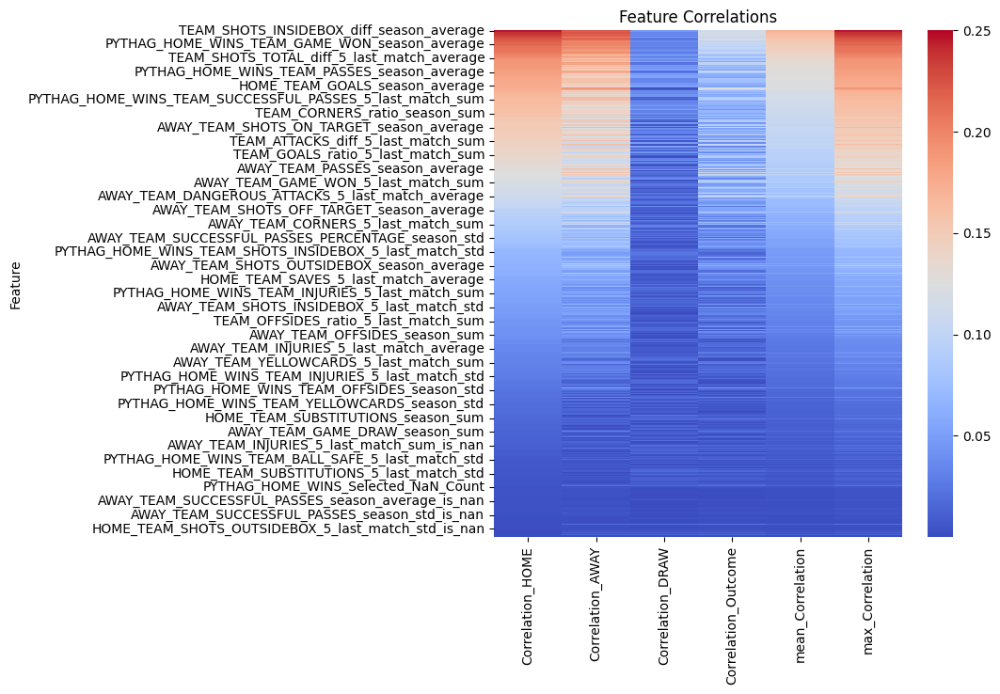

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

heatmap_data = corr_data_team.set_index('Feature').dropna()
plt.figure(figsize=(7, 7))
sns.heatmap(heatmap_data, cmap='coolwarm')
plt.title('Feature Correlations')
plt.show()

In [ ]:
len(corr_data_team[(corr_data_team['max_Correlation'] > 0.01)])

672

In [ ]:
print(len(corr_data_team[(corr_data_team['max_Correlation'] > 0.01)]))
print(train_team_data_fe.shape)
print(test_team_data_fe.shape)

selected_features = corr_data_team[(corr_data_team['max_Correlation'] > 0.01)]['Feature'].to_list()
train_team_data_fe = train_team_data_fe[selected_features]
test_team_data_fe = test_team_data_fe[selected_features]

print(train_team_data_fe.shape)
print(test_team_data_fe.shape)

775
(12303, 801)
(25368, 801)
(12303, 775)
(25368, 775)


## VIZ

In [ ]:
train_data_all = pd.concat([train_team_data_fe, train_scores['HOME_WINS']], axis=1)

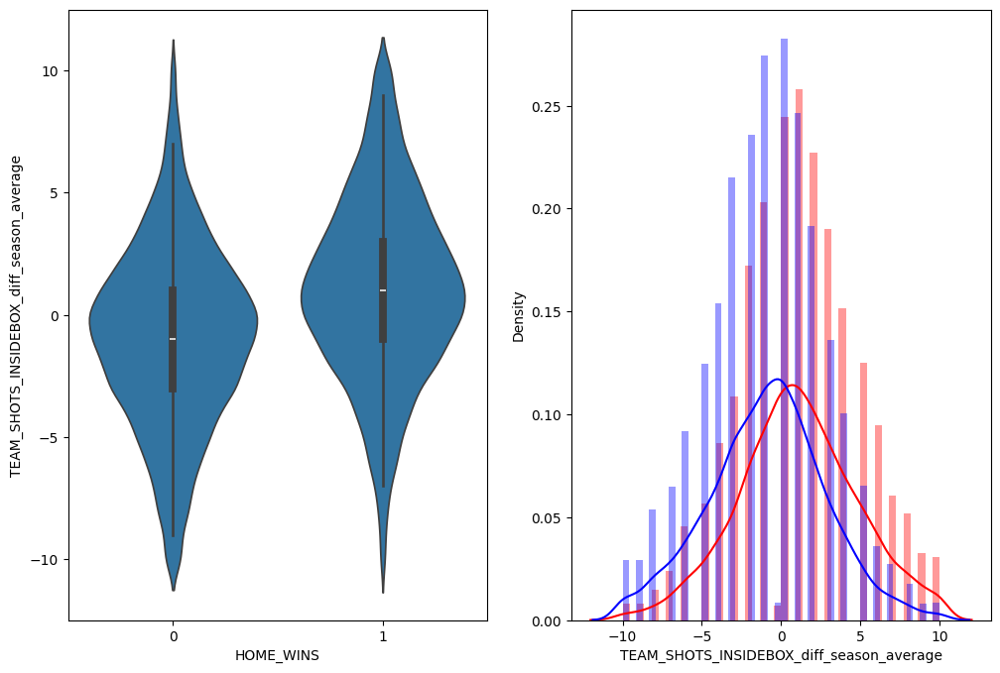

In [ ]:
plt.figure(figsize=(12, 8))
feat = "TEAM_SHOTS_INSIDEBOX_diff_season_average"
plt.subplot(1,2,1)
sns.violinplot(x = 'HOME_WINS', y = feat, data = train_data_all[0:])

plt.subplot(1,2,2)
sns.distplot(train_data_all[train_data_all['HOME_WINS'] == 1.0][feat][0:] , label = "1", color = 'red')
sns.distplot(train_data_all[train_data_all['HOME_WINS'] == 0.0][feat][0:] , label = "0" , color = 'blue' )
sns.distplot(train_data_all[train_data_all['HOME_WINS'] == 2.0][feat][0:] , label = "2" , color = 'yellow' )

plt.show()

In [ ]:
corr_data.Feature

0             TEAM_SHOTS_INSIDEBOX_diff_season_average
1                 TEAM_SHOTS_INSIDEBOX_diff_season_sum
2                    TEAM_GAME_WON_diff_season_average
3             TEAM_SHOTS_ON_TARGET_diff_season_average
4                        TEAM_GAME_WON_diff_season_sum
                            ...                       
800    PYTHAG_HOME_WINSTEAM_BALL_SAFE_5_last_match_std
801               AWAY_TEAM_BALL_SAFE_5_last_match_std
802                  HOME_fouls_to_yellow_ratio_season
803    PYTHAG_AWAY_WINSTEAM_BALL_SAFE_5_last_match_std
804                 HOME_TEAM_SUBSTITUTIONS_season_std
Name: Feature, Length: 805, dtype: object

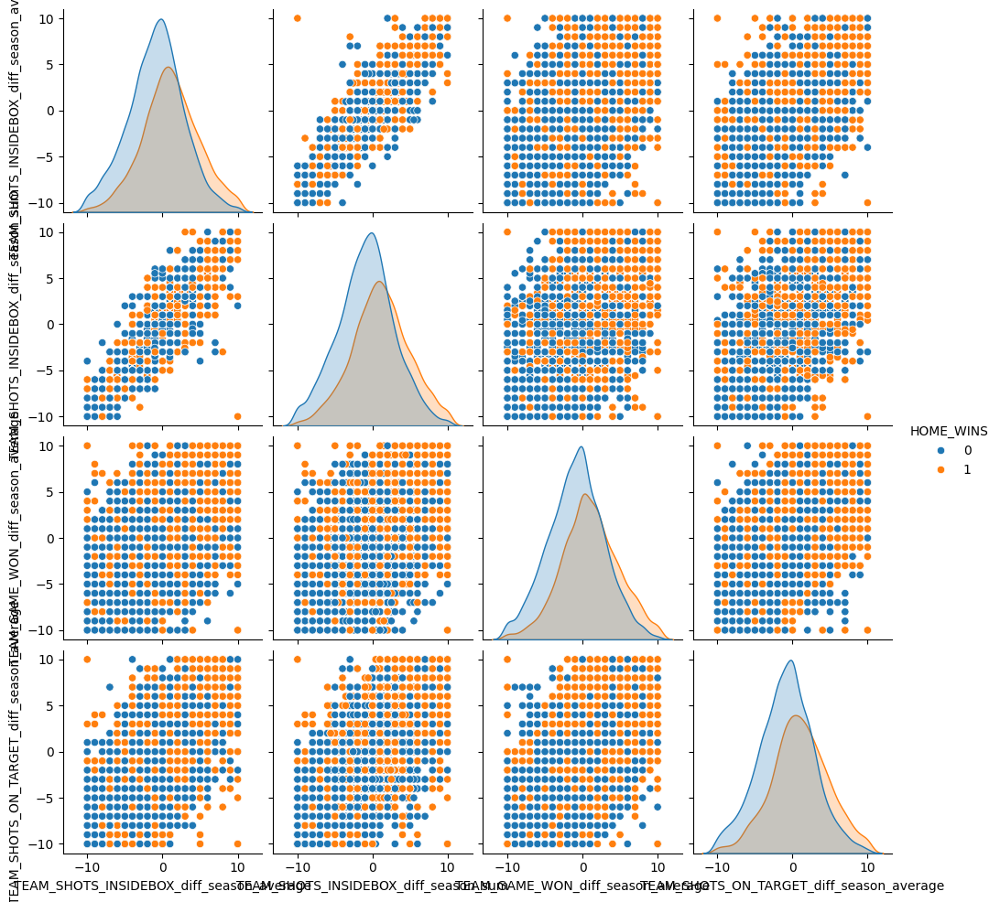

In [ ]:
n = train_data_all.shape[0]
sns.pairplot(train_data_all[['TEAM_SHOTS_INSIDEBOX_diff_season_average', 'TEAM_SHOTS_INSIDEBOX_diff_season_sum',
       'TEAM_GAME_WON_diff_season_average', 'TEAM_SHOTS_ON_TARGET_diff_season_average', 'HOME_WINS']][0:n], hue='HOME_WINS', vars=['TEAM_SHOTS_INSIDEBOX_diff_season_average', 'TEAM_SHOTS_INSIDEBOX_diff_season_sum',
       'TEAM_GAME_WON_diff_season_average', 'TEAM_SHOTS_ON_TARGET_diff_season_average'])
plt.show()

## FE Player Data

In [ ]:
def count_positions(group):
    positions_count = {
        'midfielder': 0,
        'defender': 0,
        'goalkeeper': 0,
        'attacker': 0
    }
    for position in group['POSITION']:
        if position in positions_count:
            positions_count[position] += 1
    return pd.Series(positions_count)

def data_groupby(df):
  positions_counts = df.groupby('ID').apply(count_positions)
  positions_counts['players_count'] = positions_counts['midfielder'] + positions_counts['defender'] + positions_counts['goalkeeper'] + positions_counts['attacker']
  summed_metrics_per_id = df.drop(columns=['POSITION']).groupby('ID').sum()

  train_player_home_with_counts = summed_metrics_per_id.merge(positions_counts, on='ID', how='left')

  return train_player_home_with_counts

def add_missing_indicators(df, missing_threshold=0.01, consider_columns=None):
    if consider_columns is None:
        consider_columns = df.columns

    missing_stats = df[consider_columns].isna().mean()
    features_with_lots_of_nans = missing_stats[missing_stats > missing_threshold].index.tolist()
    print(features_with_lots_of_nans)
    for feature in features_with_lots_of_nans:
        indicator_feature_name = f"{feature}_is_nan"
        df[indicator_feature_name] = df[feature].isna().astype(int)
    return df

def process_dataframe(df):
    selected_features = df.columns[4:]
    df['Selected_NaN_Count'] = df[selected_features].isna().sum(axis=1)

    df_columns = df.iloc[:,4:].columns.to_list()
    for feat in df_columns:
        df[feat] = df.groupby(['TEAM_NAME', 'POSITION'])[feat].transform(lambda x: x.fillna(x.mode().iloc[0] if not x.mode().empty else x.mean()))

    df.iloc[:, 4:] = df.iloc[:, 4:].fillna(
        df.iloc[:, 4:].mean()
    )

    return df

In [ ]:

train_home_player_statistics_df = pd.read_csv('drive/MyDrive/QRT/Train_Data/train_home_player_statistics_df.csv', index_col=0)
train_away_player_statistics_df = pd.read_csv('drive/MyDrive/QRT/Train_Data/train_away_player_statistics_df.csv', index_col=0)

train_home_player_statistics_df = add_missing_indicators(train_home_player_statistics_df, missing_threshold=0.2)
train_home_player_statistics_df = process_dataframe(train_home_player_statistics_df)

train_away_player_statistics_df = add_missing_indicators(train_away_player_statistics_df, missing_threshold=0.2)
train_away_player_statistics_df = process_dataframe(train_away_player_statistics_df)

train_player_home = train_home_player_statistics_df.iloc[:,2:]
train_player_away = train_away_player_statistics_df.iloc[:,2:]

train_player_home = train_player_home.drop(columns=['PLAYER_NAME'])
train_player_away = train_player_away.drop(columns=['PLAYER_NAME'])

train_player_home = data_groupby(train_player_home)
train_player_away = data_groupby(train_player_away)

train_player_home.columns = 'HOME_' + train_player_home.columns
train_player_away.columns = 'AWAY_' + train_player_away.columns

train_player_home = train_player_home.fillna(train_player_home.median())
train_player_away = train_player_away.fillna(train_player_away.median())

train_player_data =  pd.concat([train_player_home,train_player_away],join='inner',axis=1)
train_player_data = train_player_data.replace({np.inf:np.nan,-np.inf:np.nan})


test_player_home = pd.read_csv('drive/MyDrive/QRT/Test_Data/test_home_player_statistics_df.csv', index_col=0)
test_player_away = pd.read_csv('drive/MyDrive/QRT/Test_Data/test_away_player_statistics_df.csv', index_col=0)

test_player_home = add_missing_indicators(test_player_home, missing_threshold=0.2)
test_player_away = add_missing_indicators(test_player_away, missing_threshold=0.2)

test_player_home = data_groupby(test_player_home)
test_player_away = data_groupby(test_player_away)

test_player_home.columns = 'HOME_' + test_player_home.columns
test_player_away.columns = 'AWAY_' + test_player_away.columns

test_player_home = test_player_home.fillna(test_player_home.median())
test_player_away = test_player_away.fillna(test_player_away.median())

test_player_data =  pd.concat([test_player_home,test_player_away],join='inner',axis=1)


In [ ]:
test_player_data.shape

(25368, 614)

In [ ]:
correlated_HOME_WINS = top_correlated_features(train_player_data, train_scores, 'HOME_WINS')
correlated_AWAY_WINS = top_correlated_features(train_player_data, train_scores, 'AWAY_WINS')
correlated_DRAW = top_correlated_features(train_player_data, train_scores, 'DRAW')
correlated_Outcome = top_correlated_features(train_player_data, train_scores, 'Outcome')


correlated_HOME_WINS = correlated_HOME_WINS.rename(columns={'Correlation': 'Correlation_HOME'})
correlated_AWAY_WINS = correlated_AWAY_WINS.rename(columns={'Correlation': 'Correlation_AWAY'})
correlated_DRAW = correlated_DRAW.rename(columns={'Correlation': 'Correlation_DRAW'})
correlated_Outcome = correlated_Outcome.rename(columns={'Correlation': 'Correlation_Outcome'})

corr_home_away = correlated_HOME_WINS.merge(correlated_AWAY_WINS, on='Feature', how ='left')
corr_data = corr_home_away.merge(correlated_DRAW, on='Feature', how ='left')
corr_data_player = corr_data.merge(correlated_Outcome, on='Feature', how ='left')

corr_data_player

,Feature,Correlation_HOME,Correlation_AWAY,Correlation_DRAW,Correlation_Outcome
0,HOME_PLAYER_ASSISTS_season_sum,0.137226,0.113770,0.035663,0.049056
1,HOME_PLAYER_ACCURATE_PASSES_season_sum,0.122479,0.101044,0.032357,0.043170
2,HOME_PLAYER_GOALS_season_sum,0.120612,0.095738,0.035824,0.037886
3,HOME_PLAYER_ASSISTS_season_average,0.117306,0.096347,0.031441,0.040820
4,HOME_PLAYER_PASSES_season_sum,0.116635,0.098006,0.028938,0.043301
...,...,...,...,...,...
1089,AWAY_PLAYER_CAPTAIN_5_last_match_std,NaN,NaN,NaN,NaN
1090,AWAY_PLAYER_LONG_BALLS_5_last_match_std,NaN,NaN,NaN,NaN
1091,AWAY_PLAYER_LONG_BALLS_WON_5_last_match_std,NaN,NaN,NaN,NaN
1092,AWAY_PLAYER_SHOTS_OFF_TARGET_5_last_match_std,NaN,NaN,NaN,NaN


Error in callback <function _draw_all_if_interactive at 0x7fb4f6940ee0> (for post_execute):


ValueError: Image size of 1500x75600 pixels is too large. It must be less than 2^16 in each direction.

In [ ]:
corr_data_player = corr_data_player.fillna(0)
corr_data_player['mean_Correlation'] = (corr_data_player['Correlation_HOME'] + corr_data_player['Correlation_AWAY'] + corr_data_player['Correlation_DRAW'])/3
corr_data_player['max_Correlation'] = corr_data_player[['Correlation_HOME', 'Correlation_AWAY', 'Correlation_DRAW']].max(axis=1)

corr_data_player.sort_values("max_Correlation", ascending=False).head(20)

,Feature,Correlation_HOME,Correlation_AWAY,Correlation_DRAW,Correlation_Outcome,mean_Correlation,max_Correlation
0,HOME_PLAYER_ASSISTS_season_sum,0.137226,0.113770,0.035663,0.049056,0.095553,0.137226
9,AWAY_PLAYER_ASSISTS_season_sum,0.111592,0.130700,0.011154,0.086802,0.084482,0.130700
10,AWAY_PLAYER_GOALS_season_sum,0.108909,0.128231,0.011594,0.085542,0.082911,0.128231
1,HOME_PLAYER_ACCURATE_PASSES_season_sum,0.122479,0.101044,0.032357,0.043170,0.085293,0.122479
2,HOME_PLAYER_GOALS_season_sum,0.120612,0.095738,0.035824,0.037886,0.084058,0.120612
13,AWAY_PLAYER_GOALS_CONCEDED_season_sum,0.105459,0.120188,0.007040,0.077942,0.077562,0.120188
17,AWAY_PLAYER_GOALS_season_average,0.103204,0.119822,0.009207,0.078982,0.077411,0.119822
26,AWAY_PLAYER_ACCURATE_PASSES_season_sum,0.097851,0.119236,0.014650,0.081802,0.077246,0.119236
3,HOME_PLAYER_ASSISTS_season_average,0.117306,0.096347,0.031441,0.040820,0.081698,0.117306
12,AWAY_PLAYER_ASSISTS_season_average,0.105482,0.117060,0.003725,0.074084,0.075422,0.117060


Error in callback <function _draw_all_if_interactive at 0x7fb4f6940ee0> (for post_execute):


ValueError: Image size of 1500x75600 pixels is too large. It must be less than 2^16 in each direction.

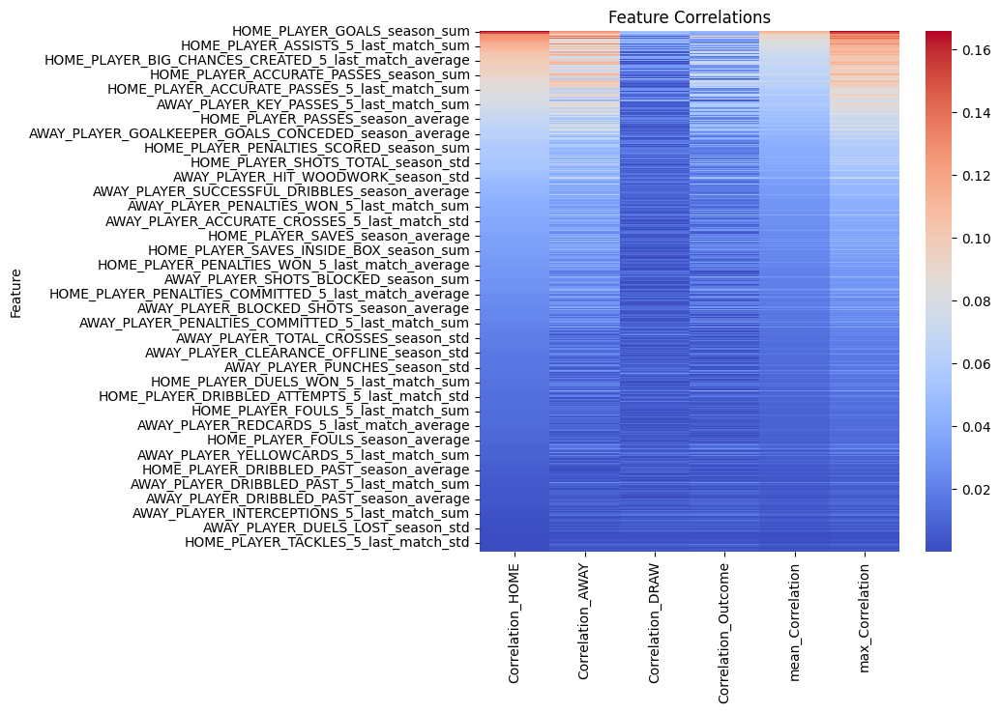

In [ ]:
heatmap_data = corr_data_player.set_index('Feature').dropna()
plt.figure(figsize=(7, 7))
sns.heatmap(heatmap_data, cmap='coolwarm')
plt.title('Feature Correlations')
plt.show()

In [ ]:
print(len(corr_data_player[(corr_data_player['max_Correlation'] > 0.01)]))

573
Error in callback <function _draw_all_if_interactive at 0x7fb4f6940ee0> (for post_execute):


ValueError: Image size of 1500x75600 pixels is too large. It must be less than 2^16 in each direction.

In [ ]:
print(train_player_data.shape)
print(test_player_data.shape)

selected_features = corr_data_player[(corr_data_player['max_Correlation'] > 0.001)]['Feature'].to_list()
train_player_data = train_player_data[selected_features]
test_player_data = test_player_data[selected_features]

print(train_player_data.shape)
print(test_player_data.shape)

(12303, 1094)
(25368, 614)


KeyError: "['HOME_PLAYER_PUNCHES_5_last_match_sum_is_nan', 'HOME_PLAYER_PUNCHES_5_last_match_average_is_nan', 'HOME_PLAYER_PUNCHES_season_sum_is_nan', 'HOME_PLAYER_PUNCHES_season_average_is_nan', 'HOME_PLAYER_PUNCHES_5_last_match_std_is_nan', 'HOME_PLAYER_PUNCHES_season_std_is_nan', 'AWAY_PLAYER_PUNCHES_5_last_match_std_is_nan', 'AWAY_PLAYER_PUNCHES_season_std_is_nan', 'AWAY_PLAYER_PUNCHES_5_last_match_sum_is_nan', 'AWAY_PLAYER_PUNCHES_season_average_is_nan', 'AWAY_PLAYER_PUNCHES_season_sum_is_nan', 'AWAY_PLAYER_PUNCHES_5_last_match_average_is_nan', 'HOME_PLAYER_CAPTAIN_5_last_match_sum_is_nan', 'HOME_PLAYER_CAPTAIN_season_sum_is_nan', 'HOME_PLAYER_CAPTAIN_5_last_match_std_is_nan', 'HOME_PLAYER_LONG_BALLS_5_last_match_std_is_nan', 'HOME_PLAYER_LONG_BALLS_WON_season_average_is_nan', 'HOME_PLAYER_LONG_BALLS_WON_5_last_match_std_is_nan', 'HOME_PLAYER_SHOTS_OFF_TARGET_5_last_match_std_is_nan', 'HOME_PLAYER_SHOTS_OFF_TARGET_season_average_is_nan', 'HOME_PLAYER_SHOTS_OFF_TARGET_season_std_is_nan', 'HOME_PLAYER_LONG_BALLS_WON_season_std_is_nan', 'HOME_PLAYER_SHOTS_OFF_TARGET_5_last_match_average_is_nan', 'HOME_PLAYER_LONG_BALLS_season_std_is_nan', 'HOME_PLAYER_LONG_BALLS_season_average_is_nan', 'HOME_PLAYER_CAPTAIN_season_average_is_nan', 'HOME_PLAYER_SHOTS_OFF_TARGET_season_sum_is_nan', 'HOME_PLAYER_LONG_BALLS_WON_season_sum_is_nan', 'HOME_PLAYER_CAPTAIN_season_std_is_nan', 'HOME_PLAYER_LONG_BALLS_season_sum_is_nan', 'HOME_PLAYER_LONG_BALLS_WON_5_last_match_average_is_nan', 'HOME_PLAYER_LONG_BALLS_5_last_match_sum_is_nan', 'HOME_PLAYER_CAPTAIN_5_last_match_average_is_nan', 'HOME_PLAYER_SHOTS_OFF_TARGET_5_last_match_sum_is_nan', 'HOME_PLAYER_LONG_BALLS_WON_5_last_match_sum_is_nan', 'HOME_PLAYER_LONG_BALLS_5_last_match_average_is_nan', 'HOME_PLAYER_PENALTIES_SAVED_5_last_match_std_is_nan', 'HOME_PLAYER_PENALTIES_SAVED_5_last_match_sum_is_nan', 'HOME_PLAYER_PENALTIES_SAVED_5_last_match_average_is_nan', 'HOME_PLAYER_GOALKEEPER_GOALS_CONCEDED_5_last_match_std_is_nan', 'HOME_PLAYER_GOALKEEPER_GOALS_CONCEDED_season_std_is_nan', 'AWAY_PLAYER_PENALTIES_SAVED_5_last_match_average_is_nan', 'AWAY_PLAYER_PENALTIES_SAVED_5_last_match_sum_is_nan', 'AWAY_PLAYER_HIT_WOODWORK_5_last_match_std_is_nan', 'AWAY_PLAYER_SHOTS_BLOCKED_season_std_is_nan', 'AWAY_PLAYER_TOTAL_CROSSES_5_last_match_std_is_nan', 'AWAY_PLAYER_TOTAL_DUELS_season_std_is_nan', 'AWAY_PLAYER_KEY_PASSES_season_std_is_nan', 'AWAY_PLAYER_SHOTS_ON_TARGET_5_last_match_std_is_nan', 'AWAY_PLAYER_TOTAL_CROSSES_season_std_is_nan', 'AWAY_PLAYER_PASSES_season_std_is_nan', 'AWAY_PLAYER_TOTAL_DUELS_5_last_match_std_is_nan', 'AWAY_PLAYER_TACKLES_season_std_is_nan', 'AWAY_PLAYER_SHOTS_ON_TARGET_season_std_is_nan', 'AWAY_PLAYER_SHOTS_TOTAL_5_last_match_std_is_nan', 'AWAY_PLAYER_SHOTS_TOTAL_season_std_is_nan', 'AWAY_PLAYER_TACKLES_5_last_match_std_is_nan', 'AWAY_PLAYER_SAVES_season_std_is_nan', 'AWAY_PLAYER_SAVES_INSIDE_BOX_season_std_is_nan', 'AWAY_PLAYER_INTERCEPTIONS_season_std_is_nan', 'AWAY_PLAYER_FOULS_5_last_match_std_is_nan', 'AWAY_PLAYER_INTERCEPTIONS_5_last_match_std_is_nan', 'AWAY_PLAYER_FOULS_DRAWN_season_std_is_nan', 'AWAY_PLAYER_CLEARANCES_5_last_match_std_is_nan', 'AWAY_PLAYER_DUELS_WON_5_last_match_std_is_nan', 'AWAY_PLAYER_FOULS_DRAWN_5_last_match_std_is_nan', 'AWAY_PLAYER_DISPOSSESSED_season_std_is_nan', 'AWAY_PLAYER_AERIALS_WON_5_last_match_std_is_nan', 'AWAY_PLAYER_ACCURATE_PASSES_5_last_match_std_is_nan', 'AWAY_PLAYER_ACCURATE_CROSSES_5_last_match_std_is_nan', 'AWAY_PLAYER_DUELS_WON_season_std_is_nan', 'AWAY_PLAYER_FOULS_season_std_is_nan', 'AWAY_PLAYER_CLEARANCES_season_std_is_nan', 'AWAY_PLAYER_ACCURATE_PASSES_season_std_is_nan', 'AWAY_PLAYER_DISPOSSESSED_5_last_match_std_is_nan', 'AWAY_PLAYER_AERIALS_WON_season_std_is_nan', 'AWAY_PLAYER_ACCURATE_CROSSES_season_std_is_nan', 'AWAY_PLAYER_SAVES_5_last_match_std_is_nan', 'AWAY_PLAYER_KEY_PASSES_5_last_match_std_is_nan', 'AWAY_PLAYER_SAVES_INSIDE_BOX_5_last_match_std_is_nan', 'AWAY_PLAYER_SHOTS_BLOCKED_5_last_match_std_is_nan', 'AWAY_PLAYER_PASSES_5_last_match_std_is_nan', 'AWAY_PLAYER_HIT_WOODWORK_season_std_is_nan', 'AWAY_PLAYER_OFFSIDES_5_last_match_std_is_nan', 'AWAY_PLAYER_OFFSIDES_season_std_is_nan', 'AWAY_PLAYER_PENALTIES_SAVED_5_last_match_std_is_nan', 'AWAY_Selected_NaN_Count', 'HOME_PLAYER_SUCCESSFUL_DRIBBLES_5_last_match_std_is_nan', 'HOME_PLAYER_DRIBBLED_PAST_season_std_is_nan', 'HOME_PLAYER_SUCCESSFUL_DRIBBLES_season_std_is_nan', 'HOME_PLAYER_DRIBBLED_PAST_5_last_match_std_is_nan', 'HOME_PLAYER_DRIBBLED_ATTEMPTS_5_last_match_std_is_nan', 'HOME_PLAYER_DRIBBLED_ATTEMPTS_season_std_is_nan', 'AWAY_PLAYER_BIG_CHANCES_CREATED_season_std_is_nan', 'AWAY_PLAYER_BLOCKED_SHOTS_5_last_match_std_is_nan', 'AWAY_PLAYER_BIG_CHANCES_MISSED_5_last_match_std_is_nan', 'AWAY_PLAYER_BIG_CHANCES_MISSED_season_std_is_nan', 'AWAY_PLAYER_BLOCKED_SHOTS_season_std_is_nan', 'AWAY_PLAYER_DUELS_LOST_season_std_is_nan', 'AWAY_PLAYER_DUELS_LOST_5_last_match_std_is_nan', 'AWAY_PLAYER_BIG_CHANCES_CREATED_5_last_match_std_is_nan', 'AWAY_PLAYER_PENALTIES_COMMITTED_season_std_is_nan', 'AWAY_PLAYER_CLEARANCE_OFFLINE_season_std_is_nan', 'AWAY_PLAYER_HIT_WOODWORK_5_last_match_sum_is_nan', 'AWAY_PLAYER_HIT_WOODWORK_5_last_match_average_is_nan', 'AWAY_PLAYER_PENALTIES_WON_season_std_is_nan', 'AWAY_PLAYER_KEY_PASSES_season_average_is_nan', 'AWAY_PLAYER_SAVES_INSIDE_BOX_season_average_is_nan', 'AWAY_PLAYER_SHOTS_BLOCKED_season_average_is_nan', 'AWAY_PLAYER_TOTAL_DUELS_season_sum_is_nan', 'AWAY_PLAYER_SHOTS_TOTAL_season_sum_is_nan', 'AWAY_PLAYER_TOTAL_CROSSES_season_sum_is_nan', 'AWAY_PLAYER_TACKLES_season_sum_is_nan', 'AWAY_PLAYER_SAVES_season_average_is_nan', 'AWAY_PLAYER_SHOTS_ON_TARGET_season_sum_is_nan', 'AWAY_PLAYER_SHOTS_BLOCKED_season_sum_is_nan', 'AWAY_PLAYER_PASSES_5_last_match_sum_is_nan', 'AWAY_PLAYER_AERIALS_WON_season_average_is_nan', 'AWAY_PLAYER_ACCURATE_CROSSES_season_average_is_nan', 'AWAY_PLAYER_ACCURATE_PASSES_season_average_is_nan', 'AWAY_PLAYER_SAVES_season_sum_is_nan', 'AWAY_PLAYER_CLEARANCES_season_average_is_nan', 'AWAY_PLAYER_DISPOSSESSED_season_average_is_nan', 'AWAY_PLAYER_DUELS_WON_season_average_is_nan', 'AWAY_PLAYER_FOULS_season_average_is_nan', 'AWAY_PLAYER_FOULS_DRAWN_season_average_is_nan', 'AWAY_PLAYER_SAVES_5_last_match_sum_is_nan', 'AWAY_PLAYER_SAVES_INSIDE_BOX_5_last_match_sum_is_nan', 'AWAY_PLAYER_SHOTS_BLOCKED_5_last_match_sum_is_nan', 'AWAY_PLAYER_INTERCEPTIONS_season_average_is_nan', 'AWAY_PLAYER_SAVES_INSIDE_BOX_season_sum_is_nan', 'AWAY_PLAYER_ACCURATE_CROSSES_5_last_match_sum_is_nan', 'AWAY_PLAYER_SHOTS_ON_TARGET_season_average_is_nan', 'AWAY_PLAYER_ACCURATE_PASSES_season_sum_is_nan', 'AWAY_PLAYER_ACCURATE_PASSES_5_last_match_sum_is_nan', 'AWAY_PLAYER_AERIALS_WON_5_last_match_sum_is_nan', 'AWAY_PLAYER_CLEARANCES_5_last_match_sum_is_nan', 'AWAY_PLAYER_DISPOSSESSED_5_last_match_sum_is_nan', 'AWAY_PLAYER_TOTAL_DUELS_season_average_is_nan', 'AWAY_PLAYER_TOTAL_CROSSES_season_average_is_nan', 'AWAY_PLAYER_DUELS_WON_5_last_match_sum_is_nan', 'AWAY_PLAYER_FOULS_5_last_match_sum_is_nan', 'AWAY_PLAYER_TACKLES_season_average_is_nan', 'AWAY_PLAYER_ACCURATE_CROSSES_season_sum_is_nan', 'AWAY_PLAYER_AERIALS_WON_season_sum_is_nan', 'AWAY_PLAYER_PASSES_season_sum_is_nan', 'AWAY_PLAYER_SHOTS_TOTAL_season_average_is_nan', 'AWAY_PLAYER_CLEARANCES_season_sum_is_nan', 'AWAY_PLAYER_DISPOSSESSED_season_sum_is_nan', 'AWAY_PLAYER_DUELS_WON_season_sum_is_nan', 'AWAY_PLAYER_FOULS_season_sum_is_nan', 'AWAY_PLAYER_FOULS_DRAWN_5_last_match_sum_is_nan', 'AWAY_PLAYER_FOULS_DRAWN_season_sum_is_nan', 'AWAY_PLAYER_INTERCEPTIONS_season_sum_is_nan', 'AWAY_PLAYER_INTERCEPTIONS_5_last_match_sum_is_nan', 'AWAY_PLAYER_KEY_PASSES_5_last_match_sum_is_nan', 'AWAY_PLAYER_KEY_PASSES_season_sum_is_nan', 'AWAY_PLAYER_PASSES_season_average_is_nan', 'AWAY_PLAYER_KEY_PASSES_5_last_match_average_is_nan', 'AWAY_PLAYER_ACCURATE_PASSES_5_last_match_average_is_nan', 'AWAY_PLAYER_SHOTS_TOTAL_5_last_match_average_is_nan', 'AWAY_PLAYER_FOULS_5_last_match_average_is_nan', 'AWAY_PLAYER_TOTAL_CROSSES_5_last_match_average_is_nan', 'AWAY_PLAYER_TOTAL_DUELS_5_last_match_average_is_nan', 'AWAY_PLAYER_FOULS_DRAWN_5_last_match_average_is_nan', 'AWAY_PLAYER_SHOTS_ON_TARGET_5_last_match_average_is_nan', 'AWAY_PLAYER_DUELS_WON_5_last_match_average_is_nan', 'AWAY_PLAYER_DISPOSSESSED_5_last_match_average_is_nan', 'AWAY_PLAYER_INTERCEPTIONS_5_last_match_average_is_nan', 'AWAY_PLAYER_CLEARANCES_5_last_match_average_is_nan', 'AWAY_PLAYER_SHOTS_BLOCKED_5_last_match_average_is_nan', 'AWAY_PLAYER_PASSES_5_last_match_average_is_nan', 'AWAY_PLAYER_AERIALS_WON_5_last_match_average_is_nan', 'AWAY_PLAYER_SAVES_INSIDE_BOX_5_last_match_average_is_nan', 'AWAY_PLAYER_TACKLES_5_last_match_average_is_nan', 'AWAY_PLAYER_TOTAL_CROSSES_5_last_match_sum_is_nan', 'AWAY_PLAYER_TACKLES_5_last_match_sum_is_nan', 'AWAY_PLAYER_TOTAL_DUELS_5_last_match_sum_is_nan', 'AWAY_PLAYER_ACCURATE_CROSSES_5_last_match_average_is_nan', 'AWAY_PLAYER_SHOTS_ON_TARGET_5_last_match_sum_is_nan', 'AWAY_PLAYER_SHOTS_TOTAL_5_last_match_sum_is_nan', 'AWAY_PLAYER_SAVES_5_last_match_average_is_nan', 'AWAY_PLAYER_ERROR_LEAD_TO_GOAL_season_std_is_nan', 'AWAY_PLAYER_PENALTIES_WON_5_last_match_std_is_nan', 'AWAY_PLAYER_HIT_WOODWORK_season_sum_is_nan', 'AWAY_PLAYER_HIT_WOODWORK_season_average_is_nan', 'HOME_PLAYER_ACCURATE_PASSES_PERCENTAGE_season_std_is_nan', 'AWAY_PLAYER_OFFSIDES_5_last_match_average_is_nan', 'AWAY_PLAYER_OFFSIDES_season_average_is_nan', 'AWAY_PLAYER_OFFSIDES_5_last_match_sum_is_nan', 'AWAY_PLAYER_OFFSIDES_season_sum_is_nan', 'HOME_PLAYER_ACCURATE_PASSES_PERCENTAGE_5_last_match_std_is_nan', 'HOME_PLAYER_SUCCESSFUL_DRIBBLES_season_average_is_nan', 'HOME_PLAYER_SUCCESSFUL_DRIBBLES_season_sum_is_nan', 'HOME_PLAYER_SUCCESSFUL_DRIBBLES_5_last_match_average_is_nan', 'HOME_PLAYER_DRIBBLED_PAST_5_last_match_average_is_nan', 'HOME_PLAYER_DRIBBLED_ATTEMPTS_5_last_match_average_is_nan', 'HOME_PLAYER_DRIBBLED_ATTEMPTS_season_sum_is_nan', 'HOME_PLAYER_SUCCESSFUL_DRIBBLES_5_last_match_sum_is_nan', 'HOME_PLAYER_DRIBBLED_PAST_5_last_match_sum_is_nan', 'HOME_PLAYER_DRIBBLED_ATTEMPTS_5_last_match_sum_is_nan', 'HOME_PLAYER_DRIBBLED_PAST_season_average_is_nan', 'HOME_PLAYER_DRIBBLED_PAST_season_sum_is_nan', 'HOME_PLAYER_DRIBBLED_ATTEMPTS_season_average_is_nan', 'AWAY_PLAYER_BIG_CHANCES_CREATED_season_sum_is_nan', 'AWAY_PLAYER_BIG_CHANCES_MISSED_season_sum_is_nan', 'AWAY_PLAYER_BLOCKED_SHOTS_season_sum_is_nan', 'AWAY_PLAYER_BIG_CHANCES_CREATED_5_last_match_sum_is_nan', 'AWAY_PLAYER_DUELS_LOST_season_sum_is_nan', 'AWAY_PLAYER_BIG_CHANCES_MISSED_5_last_match_sum_is_nan', 'AWAY_PLAYER_DUELS_LOST_5_last_match_average_is_nan', 'AWAY_PLAYER_BIG_CHANCES_CREATED_5_last_match_average_is_nan', 'AWAY_PLAYER_BIG_CHANCES_MISSED_5_last_match_average_is_nan', 'AWAY_PLAYER_BLOCKED_SHOTS_5_last_match_average_is_nan', 'AWAY_PLAYER_BLOCKED_SHOTS_5_last_match_sum_is_nan', 'AWAY_PLAYER_DUELS_LOST_season_average_is_nan', 'AWAY_PLAYER_BIG_CHANCES_MISSED_season_average_is_nan', 'AWAY_PLAYER_DUELS_LOST_5_last_match_sum_is_nan', 'AWAY_PLAYER_BLOCKED_SHOTS_season_average_is_nan', 'AWAY_PLAYER_BIG_CHANCES_CREATED_season_average_is_nan', 'AWAY_PLAYER_PENALTIES_COMMITTED_season_average_is_nan', 'AWAY_PLAYER_PENALTIES_COMMITTED_season_sum_is_nan', 'AWAY_PLAYER_CLEARANCE_OFFLINE_season_average_is_nan', 'AWAY_PLAYER_CLEARANCE_OFFLINE_season_sum_is_nan', 'AWAY_PLAYER_ERROR_LEAD_TO_GOAL_5_last_match_std_is_nan', 'HOME_PLAYER_ACCURATE_PASSES_PERCENTAGE_season_average_is_nan', 'AWAY_PLAYER_PENALTIES_WON_season_average_is_nan', 'AWAY_PLAYER_PENALTIES_WON_season_sum_is_nan', 'AWAY_PLAYER_ERROR_LEAD_TO_GOAL_season_average_is_nan', 'AWAY_PLAYER_ERROR_LEAD_TO_GOAL_season_sum_is_nan', 'AWAY_PLAYER_CLEARANCE_OFFLINE_5_last_match_std_is_nan', 'AWAY_PLAYER_PENALTIES_WON_5_last_match_sum_is_nan', 'AWAY_PLAYER_PENALTIES_WON_5_last_match_average_is_nan', 'AWAY_PLAYER_PENALTIES_COMMITTED_5_last_match_std_is_nan', 'AWAY_PLAYER_RATING_season_std_is_nan', 'AWAY_PLAYER_RATING_5_last_match_std_is_nan', 'AWAY_PLAYER_SUCCESSFUL_DRIBBLES_season_sum_is_nan', 'AWAY_PLAYER_SUCCESSFUL_DRIBBLES_5_last_match_sum_is_nan', 'AWAY_PLAYER_DRIBBLED_PAST_season_average_is_nan', 'AWAY_PLAYER_DRIBBLED_ATTEMPTS_season_average_is_nan', 'AWAY_PLAYER_DRIBBLED_ATTEMPTS_5_last_match_average_is_nan', 'AWAY_PLAYER_SUCCESSFUL_DRIBBLES_season_average_is_nan', 'AWAY_PLAYER_DRIBBLED_PAST_5_last_match_average_is_nan', 'AWAY_PLAYER_DRIBBLED_PAST_5_last_match_sum_is_nan', 'AWAY_PLAYER_DRIBBLED_ATTEMPTS_5_last_match_sum_is_nan', 'AWAY_PLAYER_SUCCESSFUL_DRIBBLES_5_last_match_average_is_nan', 'AWAY_PLAYER_DRIBBLED_ATTEMPTS_season_sum_is_nan', 'AWAY_PLAYER_DRIBBLED_PAST_season_sum_is_nan', 'HOME_PLAYER_HIT_WOODWORK_5_last_match_average_is_nan', 'HOME_PLAYER_HIT_WOODWORK_5_last_match_sum_is_nan', 'HOME_PLAYER_ACCURATE_PASSES_PERCENTAGE_5_last_match_average_is_nan', 'HOME_PLAYER_DISPOSSESSED_5_last_match_average_is_nan', 'HOME_PLAYER_ACCURATE_CROSSES_5_last_match_average_is_nan', 'HOME_PLAYER_INTERCEPTIONS_5_last_match_average_is_nan', 'HOME_PLAYER_DUELS_WON_5_last_match_sum_is_nan', 'HOME_PLAYER_KEY_PASSES_5_last_match_average_is_nan', 'HOME_PLAYER_TOTAL_DUELS_5_last_match_sum_is_nan', 'HOME_PLAYER_PASSES_5_last_match_average_is_nan', 'HOME_PLAYER_DISPOSSESSED_5_last_match_sum_is_nan', 'HOME_PLAYER_ACCURATE_PASSES_5_last_match_average_is_nan', 'HOME_PLAYER_CLEARANCES_5_last_match_sum_is_nan', 'HOME_PLAYER_SAVES_5_last_match_average_is_nan', 'HOME_PLAYER_TOTAL_DUELS_season_average_is_nan', 'HOME_PLAYER_FOULS_DRAWN_5_last_match_average_is_nan', 'HOME_PLAYER_SHOTS_BLOCKED_5_last_match_average_is_nan', 'HOME_PLAYER_CLEARANCES_5_last_match_average_is_nan', 'HOME_PLAYER_SHOTS_ON_TARGET_5_last_match_sum_is_nan', 'HOME_PLAYER_SHOTS_TOTAL_5_last_match_sum_is_nan', 'HOME_PLAYER_SHOTS_BLOCKED_5_last_match_sum_is_nan', 'HOME_PLAYER_SAVES_INSIDE_BOX_5_last_match_sum_is_nan', 'HOME_PLAYER_SAVES_5_last_match_sum_is_nan', 'HOME_PLAYER_PASSES_5_last_match_sum_is_nan', 'HOME_PLAYER_KEY_PASSES_5_last_match_sum_is_nan', 'HOME_PLAYER_DUELS_WON_5_last_match_average_is_nan', 'HOME_PLAYER_INTERCEPTIONS_5_last_match_sum_is_nan', 'HOME_PLAYER_AERIALS_WON_5_last_match_average_is_nan', 'HOME_PLAYER_FOULS_5_last_match_average_is_nan', 'HOME_PLAYER_FOULS_DRAWN_5_last_match_sum_is_nan', 'HOME_PLAYER_FOULS_5_last_match_sum_is_nan', 'HOME_PLAYER_TACKLES_5_last_match_sum_is_nan', 'HOME_PLAYER_TOTAL_CROSSES_5_last_match_sum_is_nan', 'HOME_PLAYER_SAVES_INSIDE_BOX_5_last_match_average_is_nan', 'HOME_PLAYER_ACCURATE_PASSES_season_sum_is_nan', 'HOME_PLAYER_SHOTS_ON_TARGET_5_last_match_average_is_nan', 'HOME_PLAYER_SHOTS_TOTAL_season_sum_is_nan', 'HOME_PLAYER_INTERCEPTIONS_season_average_is_nan', 'HOME_PLAYER_FOULS_DRAWN_season_average_is_nan', 'HOME_PLAYER_SHOTS_TOTAL_5_last_match_average_is_nan', 'HOME_PLAYER_DUELS_WON_season_average_is_nan', 'HOME_PLAYER_DISPOSSESSED_season_average_is_nan', 'HOME_PLAYER_CLEARANCES_season_average_is_nan', 'HOME_PLAYER_AERIALS_WON_season_average_is_nan', 'HOME_PLAYER_ACCURATE_PASSES_season_average_is_nan', 'HOME_PLAYER_ACCURATE_CROSSES_season_average_is_nan', 'HOME_PLAYER_TOTAL_DUELS_season_sum_is_nan', 'HOME_PLAYER_TOTAL_CROSSES_season_sum_is_nan', 'HOME_PLAYER_TACKLES_season_sum_is_nan', 'HOME_PLAYER_SHOTS_ON_TARGET_season_sum_is_nan', 'HOME_PLAYER_PASSES_season_average_is_nan', 'HOME_PLAYER_SHOTS_BLOCKED_season_sum_is_nan', 'HOME_PLAYER_SAVES_INSIDE_BOX_season_sum_is_nan', 'HOME_PLAYER_SAVES_season_sum_is_nan', 'HOME_PLAYER_PASSES_season_sum_is_nan', 'HOME_PLAYER_KEY_PASSES_season_sum_is_nan', 'HOME_PLAYER_INTERCEPTIONS_season_sum_is_nan', 'HOME_PLAYER_FOULS_DRAWN_season_sum_is_nan', 'HOME_PLAYER_FOULS_season_sum_is_nan', 'HOME_PLAYER_DUELS_WON_season_sum_is_nan', 'HOME_PLAYER_DISPOSSESSED_season_sum_is_nan', 'HOME_PLAYER_CLEARANCES_season_sum_is_nan', 'HOME_PLAYER_ACCURATE_CROSSES_season_sum_is_nan', 'HOME_PLAYER_KEY_PASSES_season_average_is_nan', 'HOME_PLAYER_FOULS_season_average_is_nan', 'HOME_PLAYER_AERIALS_WON_5_last_match_sum_is_nan', 'HOME_PLAYER_SAVES_INSIDE_BOX_season_average_is_nan', 'HOME_PLAYER_TACKLES_season_average_is_nan', 'HOME_PLAYER_AERIALS_WON_season_sum_is_nan', 'HOME_PLAYER_SHOTS_TOTAL_season_average_is_nan', 'HOME_PLAYER_ACCURATE_PASSES_5_last_match_sum_is_nan', 'HOME_PLAYER_SHOTS_ON_TARGET_season_average_is_nan', 'HOME_PLAYER_TOTAL_CROSSES_season_average_is_nan', 'HOME_PLAYER_SHOTS_BLOCKED_season_average_is_nan', 'HOME_PLAYER_SAVES_season_average_is_nan', 'HOME_PLAYER_TOTAL_DUELS_5_last_match_average_is_nan', 'HOME_PLAYER_ACCURATE_CROSSES_5_last_match_sum_is_nan', 'HOME_PLAYER_TOTAL_CROSSES_5_last_match_average_is_nan', 'HOME_PLAYER_TACKLES_5_last_match_average_is_nan', 'AWAY_PLAYER_GOALKEEPER_GOALS_CONCEDED_5_last_match_std_is_nan', 'AWAY_PLAYER_GOALKEEPER_GOALS_CONCEDED_season_std_is_nan', 'HOME_PLAYER_HIT_WOODWORK_season_average_is_nan', 'HOME_PLAYER_HIT_WOODWORK_season_sum_is_nan', 'AWAY_PLAYER_ERROR_LEAD_TO_GOAL_5_last_match_sum_is_nan', 'AWAY_PLAYER_ERROR_LEAD_TO_GOAL_5_last_match_average_is_nan', 'HOME_PLAYER_OFFSIDES_season_average_is_nan', 'HOME_PLAYER_OFFSIDES_season_sum_is_nan', 'HOME_PLAYER_OFFSIDES_5_last_match_average_is_nan', 'HOME_PLAYER_OFFSIDES_5_last_match_sum_is_nan', 'AWAY_PLAYER_CLEARANCE_OFFLINE_5_last_match_average_is_nan', 'AWAY_PLAYER_CLEARANCE_OFFLINE_5_last_match_sum_is_nan', 'AWAY_PLAYER_DRIBBLED_ATTEMPTS_season_std_is_nan', 'AWAY_PLAYER_DRIBBLED_PAST_season_std_is_nan', 'AWAY_PLAYER_DRIBBLED_ATTEMPTS_5_last_match_std_is_nan', 'AWAY_PLAYER_SUCCESSFUL_DRIBBLES_season_std_is_nan', 'AWAY_PLAYER_DRIBBLED_PAST_5_last_match_std_is_nan', 'AWAY_PLAYER_SUCCESSFUL_DRIBBLES_5_last_match_std_is_nan', 'AWAY_PLAYER_RATING_season_average_is_nan', 'AWAY_PLAYER_RATING_5_last_match_average_is_nan', 'AWAY_PLAYER_PENALTIES_COMMITTED_5_last_match_average_is_nan', 'AWAY_PLAYER_PENALTIES_COMMITTED_5_last_match_sum_is_nan', 'HOME_PLAYER_BIG_CHANCES_CREATED_5_last_match_sum_is_nan', 'HOME_PLAYER_BIG_CHANCES_MISSED_season_average_is_nan', 'HOME_PLAYER_DUELS_LOST_season_sum_is_nan', 'HOME_PLAYER_BLOCKED_SHOTS_season_sum_is_nan', 'HOME_PLAYER_BIG_CHANCES_MISSED_season_sum_is_nan', 'HOME_PLAYER_BIG_CHANCES_CREATED_season_average_is_nan', 'HOME_PLAYER_DUELS_LOST_season_average_is_nan', 'HOME_PLAYER_DUELS_LOST_5_last_match_average_is_nan', 'HOME_PLAYER_BLOCKED_SHOTS_5_last_match_average_is_nan', 'HOME_PLAYER_BIG_CHANCES_MISSED_5_last_match_average_is_nan', 'HOME_PLAYER_BIG_CHANCES_CREATED_5_last_match_average_is_nan', 'HOME_PLAYER_BIG_CHANCES_MISSED_5_last_match_sum_is_nan', 'HOME_PLAYER_BIG_CHANCES_CREATED_season_sum_is_nan', 'HOME_PLAYER_DUELS_LOST_5_last_match_sum_is_nan', 'HOME_PLAYER_BLOCKED_SHOTS_5_last_match_sum_is_nan', 'HOME_PLAYER_BLOCKED_SHOTS_season_average_is_nan', 'AWAY_PLAYER_CAPTAIN_5_last_match_sum_is_nan', 'HOME_PLAYER_CLEARANCE_OFFLINE_season_average_is_nan', 'HOME_PLAYER_CLEARANCE_OFFLINE_season_sum_is_nan', 'HOME_PLAYER_PENALTIES_COMMITTED_season_average_is_nan', 'HOME_PLAYER_PENALTIES_COMMITTED_season_sum_is_nan', 'HOME_PLAYER_ERROR_LEAD_TO_GOAL_season_sum_is_nan', 'HOME_PLAYER_ERROR_LEAD_TO_GOAL_season_average_is_nan', 'HOME_PLAYER_PENALTIES_WON_5_last_match_average_is_nan', 'HOME_PLAYER_PENALTIES_WON_5_last_match_sum_is_nan', 'HOME_PLAYER_PENALTIES_WON_season_sum_is_nan', 'HOME_PLAYER_PENALTIES_WON_season_average_is_nan', 'AWAY_PLAYER_ACCURATE_PASSES_PERCENTAGE_5_last_match_std_is_nan', 'HOME_Selected_NaN_Count', 'HOME_PLAYER_HIT_WOODWORK_5_last_match_std_is_nan', 'AWAY_PLAYER_PENALTIES_SAVED_season_std_is_nan', 'HOME_PLAYER_ACCURATE_CROSSES_5_last_match_std_is_nan', 'HOME_PLAYER_ACCURATE_PASSES_5_last_match_std_is_nan', 'HOME_PLAYER_SHOTS_BLOCKED_season_std_is_nan', 'HOME_PLAYER_ACCURATE_CROSSES_season_std_is_nan', 'HOME_PLAYER_SAVES_INSIDE_BOX_season_std_is_nan', 'HOME_PLAYER_AERIALS_WON_5_last_match_std_is_nan', 'HOME_PLAYER_CLEARANCES_5_last_match_std_is_nan', 'HOME_PLAYER_SHOTS_TOTAL_season_std_is_nan', 'HOME_PLAYER_DISPOSSESSED_5_last_match_std_is_nan', 'HOME_PLAYER_DUELS_WON_5_last_match_std_is_nan', 'HOME_PLAYER_FOULS_5_last_match_std_is_nan', 'HOME_PLAYER_SHOTS_ON_TARGET_season_std_is_nan', 'HOME_PLAYER_TOTAL_CROSSES_season_std_is_nan', 'HOME_PLAYER_TACKLES_season_std_is_nan', 'HOME_PLAYER_TOTAL_DUELS_5_last_match_std_is_nan', 'HOME_PLAYER_FOULS_DRAWN_5_last_match_std_is_nan', 'HOME_PLAYER_INTERCEPTIONS_5_last_match_std_is_nan', 'HOME_PLAYER_KEY_PASSES_5_last_match_std_is_nan', 'HOME_PLAYER_PASSES_5_last_match_std_is_nan', 'HOME_PLAYER_TOTAL_DUELS_season_std_is_nan', 'HOME_PLAYER_SAVES_5_last_match_std_is_nan', 'HOME_PLAYER_SAVES_INSIDE_BOX_5_last_match_std_is_nan', 'HOME_PLAYER_SHOTS_BLOCKED_5_last_match_std_is_nan', 'HOME_PLAYER_SHOTS_ON_TARGET_5_last_match_std_is_nan', 'HOME_PLAYER_SHOTS_TOTAL_5_last_match_std_is_nan', 'HOME_PLAYER_TACKLES_5_last_match_std_is_nan', 'HOME_PLAYER_TOTAL_CROSSES_5_last_match_std_is_nan', 'HOME_PLAYER_SAVES_season_std_is_nan', 'HOME_PLAYER_FOULS_season_std_is_nan', 'HOME_PLAYER_INTERCEPTIONS_season_std_is_nan', 'HOME_PLAYER_AERIALS_WON_season_std_is_nan', 'HOME_PLAYER_FOULS_DRAWN_season_std_is_nan', 'HOME_PLAYER_KEY_PASSES_season_std_is_nan', 'HOME_PLAYER_PASSES_season_std_is_nan', 'HOME_PLAYER_DISPOSSESSED_season_std_is_nan', 'HOME_PLAYER_DUELS_WON_season_std_is_nan', 'HOME_PLAYER_ACCURATE_PASSES_season_std_is_nan', 'HOME_PLAYER_CLEARANCES_season_std_is_nan', 'HOME_PLAYER_HIT_WOODWORK_season_std_is_nan', 'HOME_PLAYER_OFFSIDES_season_std_is_nan', 'HOME_PLAYER_OFFSIDES_5_last_match_std_is_nan', 'HOME_PLAYER_CLEARANCE_OFFLINE_5_last_match_average_is_nan', 'HOME_PLAYER_CLEARANCE_OFFLINE_5_last_match_sum_is_nan', 'HOME_PLAYER_ERROR_LEAD_TO_GOAL_5_last_match_sum_is_nan', 'HOME_PLAYER_ERROR_LEAD_TO_GOAL_5_last_match_average_is_nan', 'HOME_PLAYER_BLOCKED_SHOTS_season_std_is_nan', 'HOME_PLAYER_DUELS_LOST_season_std_is_nan', 'HOME_PLAYER_BIG_CHANCES_MISSED_season_std_is_nan', 'HOME_PLAYER_BIG_CHANCES_MISSED_5_last_match_std_is_nan', 'HOME_PLAYER_DUELS_LOST_5_last_match_std_is_nan', 'HOME_PLAYER_BLOCKED_SHOTS_5_last_match_std_is_nan', 'HOME_PLAYER_BIG_CHANCES_CREATED_5_last_match_std_is_nan', 'HOME_PLAYER_BIG_CHANCES_CREATED_season_std_is_nan', 'AWAY_PLAYER_ACCURATE_PASSES_PERCENTAGE_season_std_is_nan', 'HOME_PLAYER_RATING_season_average_is_nan', 'HOME_PLAYER_RATING_5_last_match_average_is_nan', 'HOME_PLAYER_CLEARANCE_OFFLINE_season_std_is_nan', 'HOME_PLAYER_PENALTIES_COMMITTED_season_std_is_nan', 'AWAY_PLAYER_PENALTIES_SAVED_season_sum_is_nan', 'AWAY_PLAYER_PENALTIES_SAVED_season_average_is_nan', 'HOME_PLAYER_PENALTIES_WON_5_last_match_std_is_nan', 'HOME_PLAYER_ERROR_LEAD_TO_GOAL_season_std_is_nan', 'HOME_PLAYER_PENALTIES_COMMITTED_5_last_match_average_is_nan', 'HOME_PLAYER_PENALTIES_COMMITTED_5_last_match_sum_is_nan', 'HOME_PLAYER_PENALTIES_WON_season_std_is_nan', 'HOME_PLAYER_PENALTIES_SAVED_season_std_is_nan', 'AWAY_PLAYER_CAPTAIN_season_sum_is_nan', 'AWAY_PLAYER_ACCURATE_PASSES_PERCENTAGE_season_average_is_nan', 'HOME_PLAYER_CLEARANCE_OFFLINE_5_last_match_std_is_nan', 'HOME_PLAYER_ERROR_LEAD_TO_GOAL_5_last_match_std_is_nan', 'AWAY_PLAYER_ACCURATE_PASSES_PERCENTAGE_5_last_match_average_is_nan', 'AWAY_PLAYER_CAPTAIN_season_average_is_nan', 'AWAY_PLAYER_SHOTS_OFF_TARGET_season_sum_is_nan', 'AWAY_PLAYER_LONG_BALLS_5_last_match_sum_is_nan', 'AWAY_PLAYER_LONG_BALLS_season_sum_is_nan', 'AWAY_PLAYER_LONG_BALLS_WON_5_last_match_sum_is_nan', 'AWAY_PLAYER_LONG_BALLS_season_average_is_nan', 'AWAY_PLAYER_LONG_BALLS_WON_season_average_is_nan', 'AWAY_PLAYER_SHOTS_OFF_TARGET_5_last_match_sum_is_nan', 'AWAY_PLAYER_LONG_BALLS_WON_5_last_match_average_is_nan', 'AWAY_PLAYER_LONG_BALLS_5_last_match_std_is_nan', 'AWAY_PLAYER_CAPTAIN_season_std_is_nan', 'AWAY_PLAYER_CAPTAIN_5_last_match_std_is_nan', 'AWAY_PLAYER_LONG_BALLS_5_last_match_average_is_nan', 'AWAY_PLAYER_SHOTS_OFF_TARGET_5_last_match_std_is_nan', 'AWAY_PLAYER_LONG_BALLS_WON_5_last_match_std_is_nan', 'AWAY_PLAYER_SHOTS_OFF_TARGET_season_average_is_nan', 'AWAY_PLAYER_LONG_BALLS_season_std_is_nan', 'AWAY_PLAYER_CAPTAIN_5_last_match_average_is_nan', 'AWAY_PLAYER_LONG_BALLS_WON_season_sum_is_nan', 'AWAY_PLAYER_LONG_BALLS_WON_season_std_is_nan', 'AWAY_PLAYER_SHOTS_OFF_TARGET_season_std_is_nan', 'AWAY_PLAYER_SHOTS_OFF_TARGET_5_last_match_average_is_nan', 'HOME_PLAYER_RATING_5_last_match_std_is_nan', 'HOME_PLAYER_RATING_season_std_is_nan', 'HOME_PLAYER_PENALTIES_SAVED_season_average_is_nan', 'HOME_PLAYER_PENALTIES_SAVED_season_sum_is_nan'] not in index"

Error in callback <function _draw_all_if_interactive at 0x7fb4f6940ee0> (for post_execute):


ValueError: Image size of 1500x75600 pixels is too large. It must be less than 2^16 in each direction.

## Save FE data

In [ ]:
train_data_to_modeling = pd.concat([train_team_data_fe, train_player_data], axis = 1)
test_data_to_modeling = pd.concat([test_team_data_fe, test_player_data], axis = 1)
train_scores['Outcome'] = train_scores.apply(combine_outcomes, axis=1)
train_new_y = train_scores['Outcome']
train_scores_supp['GOAL_DIFF_HOME_AWAY'] = pd.to_numeric(train_scores_supp['GOAL_DIFF_HOME_AWAY'], errors='coerce')

train_new_y_supp = train_scores_supp['GOAL_DIFF_HOME_AWAY']

# test_data_to_modeling.shape
# train_data_to_modeling.to_csv('drive/MyDrive/QRT/Train_Data/train_data_to_modeling_corr.csv')
# test_data_to_modeling.to_csv('drive/MyDrive/QRT/Test_Data/test_data_to_modeling_corr.csv')
# train_new_y.to_csv('drive/MyDrive/QRT/Train_Data/train_new_y.csv')



In [ ]:
train_data_to_modeling = pd.read_csv('drive/MyDrive/QRT/Train_Data/train_data_to_modeling_corr.csv', index_col=0)
test_data_to_modeling = pd.read_csv('drive/MyDrive/QRT/Test_Data/test_data_to_modeling_corr.csv', index_col=0)
# train_new_y = pd.read_csv('drive/MyDrive/QRT/Train_Data/train_new_y.csv', index_col=0)


# Modeling

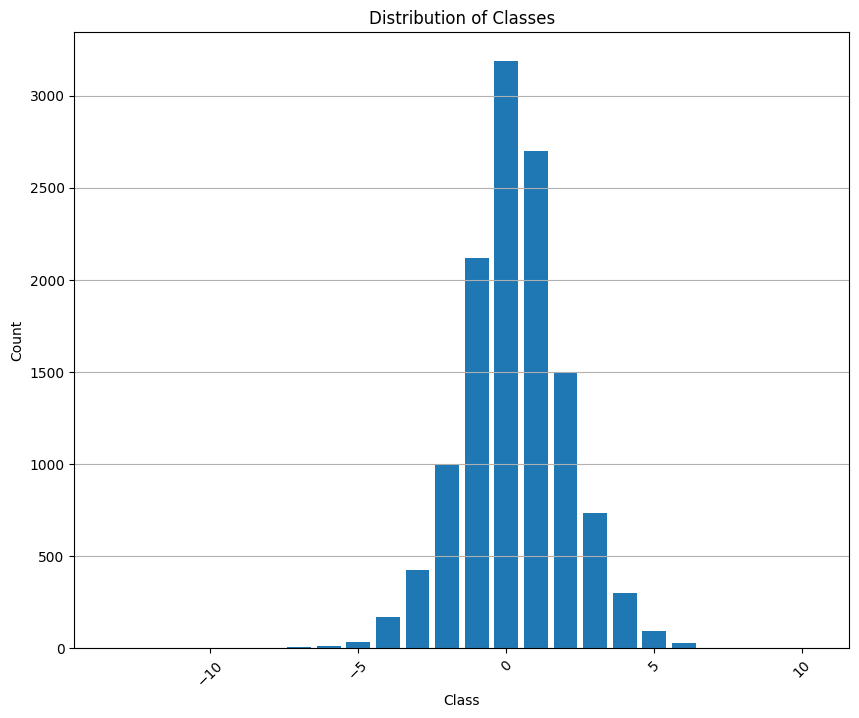

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame with 'id' and 'target' columns

# Count the occurrence of each class
class_counts = train_scores_supp['GOAL_DIFF_HOME_AWAY'].value_counts().sort_index()

# Plotting
plt.figure(figsize=(10, 8))  # Adjust the figure size as needed
plt.bar(class_counts.index, class_counts.values)
plt.xlabel('Class')  # Adjust label as needed
plt.ylabel('Count')  # Adjust label as needed
plt.title('Distribution of Classes')  # Adjust title as needed
plt.xticks(rotation=45)  # Rotates the x-axis labels to prevent overlap
plt.grid(axis='y')  # Adds a grid on y-axis for better readability

plt.show()


## LGBM Regressor

In [ ]:
#train_scores['Outcome'] = train_scores.apply(combine_outcomes, axis=1)
#train_new_y = train_scores['Outcome']
train_scores_supp['GOAL_DIFF_HOME_AWAY'] = pd.to_numeric(train_scores_supp['GOAL_DIFF_HOME_AWAY'], errors='coerce')

train_scores_supp['LogGD'] = np.sign(train_scores_supp['GOAL_DIFF_HOME_AWAY']) * np.log1p(np.abs(train_scores_supp['GOAL_DIFF_HOME_AWAY']))
train_new_y = train_scores_supp['LogGD']
train_new_y.fillna(0, inplace=True)
train_new_y


ID
0       -1.098612
1        0.000000
2       -0.693147
3        0.693147
4        0.000000
           ...   
12298   -0.693147
12299   -0.693147
12300   -0.693147
12301    1.386294
12302    1.098612
Name: LogGD, Length: 12303, dtype: float64

In [ ]:
import optuna
import lightgbm as lgb
import numpy as np
from sklearn import metrics, model_selection

def tune_lgbm_params(train_data_fe, train_new_y):
    def objective(trial):
        n_splits = 5
        cv_results = []

        # Use KFold for regression tasks
        kf = model_selection.KFold(n_splits=n_splits, shuffle=True, random_state=42)

        for train_index, valid_index in kf.split(train_data_fe):
            X_train, X_valid = train_data_fe.iloc[train_index], train_data_fe.iloc[valid_index]
            y_train, y_valid = train_new_y.iloc[train_index], train_new_y.iloc[valid_index]

            param = {
                'objective': 'regression',  # Adjusted for regression
                'boosting_type': 'goss',
                'verbosity': -1,
                'early_stopping_rounds': 200,
                'reg_lambda': trial.suggest_float('reg_lambda', 0, 1),
                'n_estimators': trial.suggest_int('n_estimators', 100, 5000),
                'num_leaves': trial.suggest_int('num_leaves', 31, 5000),
                'max_depth': trial.suggest_int('max_depth', 3, 30),
                'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.3),
                'feature_fraction': trial.suggest_float('feature_fraction', 0.4, 1.0),
                'min_gain_to_split': trial.suggest_float('min_gain_to_split', 0, 15),
                'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 20, 100),
            }

            lgb_train = lgb.Dataset(X_train, y_train)
            lgb_eval = lgb.Dataset(X_valid, y_valid, reference=lgb_train)

            model = lgb.train(param, lgb_train, valid_sets=[lgb_eval])

            preds = model.predict(X_valid, num_iteration=model.best_iteration)

            # Use RMSE as the evaluation metric for regression
            rmse = np.sqrt(metrics.mean_squared_error(y_valid, preds))

            cv_results.append(rmse)

        avg_rmse = np.mean(cv_results)

        return avg_rmse

    study = optuna.create_study(direction='minimize')  # Minimize the RMSE for regression tasks
    study.optimize(objective, n_trials=100)  # Adjust the number of trials as necessary
    best_params_lgbm = study.best_trial.params

    print('Best trial:', best_params_lgbm)

    return best_params_lgbm


In [ ]:
best_params_lgbm = tune_lgbm_params(train_data_to_modeling, train_new_y)
print(best_params_lgbm)

[I 2024-03-09 20:26:11,980] A new study created in memory with name: no-name-822c7971-06d8-4abf-a722-746111003ff4
[I 2024-03-09 20:26:30,207] Trial 0 finished with value: 0.8086980660411088 and parameters: {'reg_lambda': 0.7200822565658834, 'n_estimators': 4129, 'num_leaves': 725, 'max_depth': 23, 'learning_rate': 0.2122898845089524, 'feature_fraction': 0.6482491929595906, 'min_gain_to_split': 4.2645659998569965, 'min_data_in_leaf': 75}. Best is trial 0 with value: 0.8086980660411088.
[I 2024-03-09 20:26:47,350] Trial 1 finished with value: 0.8029801599478195 and parameters: {'reg_lambda': 0.7438237420628734, 'n_estimators': 1653, 'num_leaves': 921, 'max_depth': 24, 'learning_rate': 0.06953479169205243, 'feature_fraction': 0.7922539714920727, 'min_gain_to_split': 3.4479124830073737, 'min_data_in_leaf': 96}. Best is trial 1 with value: 0.8029801599478195.
[I 2024-03-09 20:27:04,850] Trial 2 finished with value: 0.810401045882219 and parameters: {'reg_lambda': 0.761045362561583, 'n_estim

Best trial: {'reg_lambda': 0.14679369591209815, 'n_estimators': 4452, 'num_leaves': 4532, 'max_depth': 15, 'learning_rate': 0.011398310110437493, 'feature_fraction': 0.6435978552917814, 'min_gain_to_split': 7.126270303406885, 'min_data_in_leaf': 69}
{'reg_lambda': 0.14679369591209815, 'n_estimators': 4452, 'num_leaves': 4532, 'max_depth': 15, 'learning_rate': 0.011398310110437493, 'feature_fraction': 0.6435978552917814, 'min_gain_to_split': 7.126270303406885, 'min_data_in_leaf': 69}


In [ ]:
def test_predict(train, test, y, best_params_lgbm):
    best_params_lgbm['boosting_type'] = 'goss'
    best_params_lgbm['objective'] = 'regression'
    best_params_lgbm['verbosity'] = -1

    lgb_full_train = lgb.Dataset(train, y)

    final_model = lgb.train(best_params_lgbm, lgb_full_train)

    test_predictions = final_model.predict(test)

    return test_predictions


In [ ]:
predictions = test_predict(train_data_to_modeling, test_data_to_modeling, train_new_y, best_params_lgbm)
predictions

array([-0.33068641, -0.31007451,  0.5641664 , ...,  0.6662425 ,
        0.27054289,  0.32023039])

In [ ]:
def classify_predictions(predictions):
    # Define your thresholds based on your analysis
    draw_lower_threshold = -0.05
    draw_upper_threshold = 0.2

    classifications = []
    for prediction in predictions:
        if draw_lower_threshold <= prediction <= draw_upper_threshold:
            classifications.append(0)
        elif prediction > draw_upper_threshold:
            classifications.append(1)
        else:  # prediction < draw_lower_threshold
            classifications.append(2)
    return classifications

classifications = classify_predictions(predictions)


In [ ]:
classifications_df = pd.DataFrame(classifications, columns=["Outcome"])
print(classifications_df["Outcome"].value_counts()/len(classifications_df["Outcome"]))

1    0.419387
2    0.314491
0    0.266123
Name: Outcome, dtype: float64


In [ ]:
print(train_scores["Outcome"].value_counts()/len(train_scores["Outcome"]))

1    0.435341
2    0.305698
0    0.258961
Name: Outcome, dtype: float64


In [ ]:
import pandas as pd
import numpy as np

def generate_predictions(test, classifications):
    # Initialize the submission DataFrame with zeros and appropriate columns
    submission_df = pd.DataFrame(0, index=np.arange(len(classifications)), columns=['HOME_WINS', 'DRAW', 'AWAY_WINS'])

    # Assign 1 to the appropriate column based on the classification
    for i, classification in enumerate(classifications):
        if classification == 1:
            submission_df.loc[i, 'HOME_WINS'] = 1
        elif classification == 0:
            submission_df.loc[i, 'DRAW'] = 1
        elif classification == 2:
            submission_df.loc[i, 'AWAY_WINS'] = 1

    submission_df.columns = ['HOME_WINS', 'DRAW', 'AWAY_WINS']
    submission_df.index = test_home.index
    submission_df = submission_df.reset_index()
    submission_df.columns = ['ID', 'HOME_WINS', 'DRAW', 'AWAY_WINS']

    return submission_df


submission_df = generate_predictions(test_data_to_modeling, classifications)
submission_df

,ID,HOME_WINS,DRAW,AWAY_WINS
0,12303,0,0,1
1,12304,0,0,1
2,12305,1,0,0
3,12306,0,0,1
4,12307,0,0,1
...,...,...,...,...
25363,37666,0,1,0
25364,37667,0,1,0
25365,37668,1,0,0
25366,37669,1,0,0


In [ ]:
submission_df['HOME_WINS'] = 0
submission_df['DRAW'] = 1
submission_df['AWAY_WINS'] = 0
submission_df

,ID,HOME_WINS,DRAW,AWAY_WINS
0,12303,0,1,0
1,12304,0,1,0
2,12305,0,1,0
3,12306,0,1,0
4,12307,0,1,0
...,...,...,...,...
25363,37666,0,1,0
25364,37667,0,1,0
25365,37668,0,1,0
25366,37669,0,1,0


In [ ]:
submission_df.to_csv('drive/MyDrive/QRT/Train_Data/submission_regression.csv', index=False)

In [ ]:
HOME_WINS: 0,43716493219804475
DRAW: 0,27
AWAY_WINS: 0,29


## KNN

In [ ]:
import optuna
import numpy as np
from catboost import CatBoostClassifier
from sklearn import metrics, model_selection

def tune_catboost_params(train_data_fe, train_new_y):

    def objective(trial):
        n_splits = 5
        cv_results = []

        kf = model_selection.RepeatedStratifiedKFold(n_splits=n_splits, n_repeats=2, random_state=42)

        for train_index, valid_index in kf.split(train_data_fe, train_new_y):
            X_train, X_valid = train_data_fe.iloc[train_index], train_data_fe.iloc[valid_index]
            y_train, y_valid = train_new_y.iloc[train_index], train_new_y.iloc[valid_index]

            param = {
                'iterations': trial.suggest_int('iterations', 100, 1000),
                'depth': trial.suggest_int('depth', 4, 10),
                'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
                'random_strength': trial.suggest_int('random_strength', 0, 100),
                'bagging_temperature': trial.suggest_float('bagging_temperature', 0.0, 1.0),
                'border_count': trial.suggest_int('border_count', 1, 255),
                'l2_leaf_reg': trial.suggest_int('l2_leaf_reg', 2, 30),
                'loss_function': 'MultiClass',
                'verbose': False,
                'thread_count': -1,
            }

            model = CatBoostClassifier(**param)
            model.fit(X_train, y_train, eval_set=(X_valid, y_valid), early_stopping_rounds=200, verbose=False)

            preds = model.predict(X_valid)
            # acc = metrics.accuracy_score(y_valid, preds)
            acc = metrics.f1_score(y_valid, preds, average='weighted')

            cv_results.append(acc)

        avg_acc = np.mean(cv_results)
        return avg_acc

    study = optuna.create_study(direction='maximize')
    study.optimize(objective, n_trials=20)
    best_params_catboost = study.best_trial.params

    print('Best trial:', study.best_trial.params)

    return best_params_catboost


In [ ]:
best_params_cat = tune_catboost_params(train_data_to_modeling, train_new_y)
print(best_params_cat)

[I 2024-03-16 19:44:15,206] A new study created in memory with name: no-name-f9cc6182-a7fa-47a3-8ace-6adbe41a349c
[I 2024-03-16 19:46:11,598] Trial 0 finished with value: 0.41880016664944747 and parameters: {'iterations': 693, 'depth': 4, 'learning_rate': 0.28267903881175355, 'random_strength': 0, 'bagging_temperature': 0.8458885291314969, 'border_count': 224, 'l2_leaf_reg': 12}. Best is trial 0 with value: 0.41880016664944747.
[I 2024-03-16 19:48:32,329] Trial 1 finished with value: 0.42242287864354056 and parameters: {'iterations': 583, 'depth': 4, 'learning_rate': 0.2695368745071105, 'random_strength': 93, 'bagging_temperature': 0.07826788561761489, 'border_count': 252, 'l2_leaf_reg': 18}. Best is trial 1 with value: 0.42242287864354056.
[I 2024-03-16 19:51:13,428] Trial 2 finished with value: 0.42401986654183554 and parameters: {'iterations': 520, 'depth': 5, 'learning_rate': 0.15425827911731338, 'random_strength': 53, 'bagging_temperature': 0.8267297208821331, 'border_count': 61, 

Best trial: {'iterations': 367, 'depth': 10, 'learning_rate': 0.15490258205996155, 'random_strength': 5, 'bagging_temperature': 0.588324103711208, 'border_count': 118, 'l2_leaf_reg': 29}
{'iterations': 367, 'depth': 10, 'learning_rate': 0.15490258205996155, 'random_strength': 5, 'bagging_temperature': 0.588324103711208, 'border_count': 118, 'l2_leaf_reg': 29}


In [ ]:
from catboost import CatBoostClassifier
import numpy as np

def test_predict_catboost(train, test, y, best_params_catboost):
    best_params_catboost['loss_function'] = 'MultiClass'
    best_params_catboost['verbose'] = False

    # Initialize and train the CatBoost model
    final_model = CatBoostClassifier(**best_params_catboost)
    final_model.fit(train, y)

    # Predict on the test data
    # For CatBoost, the predict function returns the class labels directly for classification
    test_predictions = final_model.predict(test)

    # CatBoost's predict method returns an array of shape (n_samples, 1) for classification,
    # so it's flattened to match the expected output shape (n_samples,)
    test_predictions = test_predictions.flatten()

    return test_predictions


In [ ]:
predictions = test_predict_catboost(train_data_to_modeling, test_data_to_modeling, train_new_y, best_params_cat)

## LGBM

In [ ]:
##

In [ ]:
import optuna
import lightgbm as lgb
import numpy as np
from sklearn import metrics, model_selection

def tune_lgbm_params(train_data_fe, train_new_y):

  def objective(trial):
      n_splits = 5
      cv_results = []

      kf = model_selection.RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=42)

      for train_index, valid_index in kf.split(train_data_fe, train_new_y):
          X_train, X_valid = train_data_fe.iloc[train_index], train_data_fe.iloc[valid_index]
          y_train, y_valid = train_new_y.iloc[train_index], train_new_y.iloc[valid_index]


          param = {
              'objective': 'multiclass',
              'boosting_type':'goss',
              # 'metric': 'multi_logloss',
              'num_class': 3,
              'verbosity': -1,
              # 'num_threads': -1,
              'early_stopping_rounds':200,
              'reg_lambda': trial.suggest_float('reg_lambda', 0, 0.3),
              'n_estimators': trial.suggest_int('n_estimators', 2000, 5000),
              'num_leaves': trial.suggest_int('num_leaves', 200, 5000),
              'max_depth': trial.suggest_int('max_depth', 3, 30),
              'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.3),
              'feature_fraction': trial.suggest_float('feature_fraction', 0.5, 1.0),
              # 'bagging_fraction': trial.suggest_float('bagging_fraction', 0.5, 1.0),
              # 'bagging_freq': trial.suggest_int('bagging_freq', 1, 5),
              'min_gain_to_split': trial.suggest_float('min_gain_to_split', 0, 15),
              'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 2, 300),
          }

          lgb_train = lgb.Dataset(X_train, y_train)
          lgb_eval = lgb.Dataset(X_valid, y_valid, reference=lgb_train)

          model = lgb.train(param, lgb_train, valid_sets=[lgb_eval])
          # model = lgb.train(param, lgb_train, valid_sets=[lgb_eval], early_stopping_rounds=200)


          preds = model.predict(X_valid, num_iteration=model.best_iteration)
          preds = np.argmax(preds, axis=1)
          # conf_matrix = metrics.confusion_matrix(
          #                     y_valid, preds, sample_weight=None,
          #                     normalize=None
          #                     )
          # print(conf_matrix)
          acc = metrics.f1_score(y_valid, preds, average='weighted')

          cv_results.append(acc)

      avg_acc = np.mean(cv_results)

      return avg_acc

  study = optuna.create_study(direction='maximize')
  study.optimize(objective, n_trials=20)
  best_params_lgbm = study.best_trials[:5]

  print('Best trial:', study.best_trial.params)

  return best_params_lgbm


In [ ]:
best_params_lgbm = tune_lgbm_params(train_data_to_modeling, train_new_y)
print(best_params_lgbm)

[I 2024-03-16 19:40:13,157] A new study created in memory with name: no-name-ff8fabcc-b843-4b4f-8de3-713186c82f5a
[I 2024-03-16 19:41:42,916] Trial 0 finished with value: 0.4066739023130984 and parameters: {'reg_lambda': 0.01037094965686257, 'n_estimators': 3828, 'num_leaves': 1666, 'max_depth': 7, 'learning_rate': 0.2903747186944072, 'feature_fraction': 0.6336641061916104, 'min_gain_to_split': 10.951440689732772, 'min_data_in_leaf': 147}. Best is trial 0 with value: 0.4066739023130984.
[I 2024-03-16 19:42:54,103] Trial 1 finished with value: 0.4187402939080653 and parameters: {'reg_lambda': 0.04047122970314405, 'n_estimators': 3651, 'num_leaves': 3117, 'max_depth': 3, 'learning_rate': 0.1637825127682315, 'feature_fraction': 0.8744152588433207, 'min_gain_to_split': 11.169520037041881, 'min_data_in_leaf': 17}. Best is trial 1 with value: 0.4187402939080653.
[W 2024-03-16 19:43:33,408] Trial 2 failed with parameters: {'reg_lambda': 0.124525154192251, 'n_estimators': 3547, 'num_leaves': 2

KeyboardInterrupt: 

In [ ]:
best_params_lgbm_list = [
    {'reg_lambda': 0.16869071340465977, 'n_estimators': 3548, 'num_leaves': 3052, 'max_depth': 25, 'learning_rate': 0.0013042257073252184, 'feature_fraction': 0.6068081818587548, 'min_gain_to_split': 10.048480192890779, 'min_data_in_leaf': 224},
    {'reg_lambda': 0.15852119859360603, 'n_estimators': 3864, 'num_leaves': 2929, 'max_depth': 14, 'learning_rate': 0.007984477159713444, 'feature_fraction': 0.5129803531085411, 'min_gain_to_split': 4.732604841421448, 'min_data_in_leaf': 166},
    {'reg_lambda': 0.12060311961739709, 'n_estimators': 2643, 'num_leaves': 2870, 'max_depth': 20, 'learning_rate': 0.0012091778663682329, 'feature_fraction': 0.7824674798025453, 'min_gain_to_split': 12.322230798919971, 'min_data_in_leaf': 7},
    {'reg_lambda': 0.27302630902588687, 'n_estimators': 3027, 'num_leaves': 285, 'max_depth': 30, 'learning_rate': 0.013247511339905371, 'feature_fraction': 0.8341865059331346, 'min_gain_to_split': 14.854655274819898, 'min_data_in_leaf': 277},
    {'reg_lambda': 0.24828869511160598, 'n_estimators': 3077, 'num_leaves': 852, 'max_depth': 29, 'learning_rate': 0.03456070690331787, 'feature_fraction': 0.7332207329777274, 'min_gain_to_split': 14.835618552322948, 'min_data_in_leaf': 299},

]

In [ ]:
from scipy.stats import mode
import numpy as np
import lightgbm as lgb

def test_predict_lgbm(train, test, y, best_params_lgbm_list):
    predictions_list = []
    for best_params in best_params_lgbm_list:
        best_params['boosting_type'] = 'goss'
        best_params['objective'] = 'multiclass'
        best_params['num_class'] = 3
        best_params['verbosity'] = -1
        lgb_full_train = lgb.Dataset(train, y)
        final_model = lgb.train(best_params, lgb_full_train)
        test_predictions = final_model.predict(test)
        # Converting raw probabilities to class predictions
        test_predictions_class = np.argmax(test_predictions, axis=1)
        predictions_list.append(test_predictions_class)

    # Combining predictions from all models for each sample
    predictions_array = np.array(predictions_list)

    # Majority vote across predictions for each sample
    # Note: mode() returns both the mode and its count, so we select the mode [0]
    final_predictions = mode(predictions_array, axis=0)[0].flatten()  # Flatten to convert to 1D array

    return final_predictions


In [ ]:
predictions = test_predict_lgbm(train_data_to_modeling, test_data_to_modeling, train_new_y, best_params_lgbm_list)

In [ ]:
def test_predict(train, test, y, best_params_lgbm):
  best_params_lgbm['boosting_type'] = 'goss'
  best_params_lgbm['objective'] = 'multiclass'
  # best_params_lgbm['metric'] = 'multi_logloss'
  best_params_lgbm['num_class'] = 3
  best_params_lgbm['verbosity'] = -1
  lgb_full_train = lgb.Dataset(train, y)
  final_model = lgb.train(best_params_lgbm, lgb_full_train)
  test_predictions = final_model.predict(test)
  test_predictions = np.argmax(test_predictions, axis=1)
  return test_predictions


In [ ]:
best_params_lgbm = {'reg_lambda': 0.16869071340465977, 'n_estimators': 3548, 'num_leaves': 3052, 'max_depth': 25, 'learning_rate': 0.0013042257073252184, 'feature_fraction': 0.6068081818587548, 'min_gain_to_split': 10.048480192890779, 'min_data_in_leaf': 224}
predictions = test_predict(train_data_to_modeling, test_data_to_modeling, train_new_y, best_params_lgbm)

In [ ]:
def generate_predictions(test, predictions):

  submission_df = pd.DataFrame(0, index=np.arange(len(predictions)), columns=['HOME_WINS', 'DRAW', 'AWAY_WINS'])

  submission_df.loc[predictions == 1, 'HOME_WINS'] = 1
  submission_df.loc[predictions == 0, 'DRAW'] = 1
  submission_df.loc[predictions == 2, 'AWAY_WINS'] = 1

  submission_df.columns = ['HOME_WINS', 'DRAW', 'AWAY_WINS']
  submission_df.index = test_home.index
  submission_df = submission_df.reset_index()
  submission_df.columns = ['ID', 'HOME_WINS', 'DRAW', 'AWAY_WINS']
  # submission_df = submission_df.reset_index(drop=True)

  return submission_df


In [ ]:
predictions

array([0, 2, 1, ..., 1, 1, 1])

In [ ]:
submission_df = generate_predictions(test_data_to_modeling, predictions)

In [ ]:
submission_df[['HOME_WINS', 'DRAW', 'AWAY_WINS']].value_counts()/len(submission_df)

HOME_WINS  DRAW  AWAY_WINS
1          0     0            0.632411
0          0     1            0.320246
           1     0            0.047343
dtype: float64

In [ ]:
submission_df

,ID,HOME_WINS,DRAW,AWAY_WINS
0,12303,0,1,0
1,12304,0,0,1
2,12305,1,0,0
3,12306,1,0,0
4,12307,1,0,0
...,...,...,...,...
25363,37666,0,0,1
25364,37667,1,0,0
25365,37668,1,0,0
25366,37669,1,0,0


In [ ]:
submission_df.to_csv('drive/MyDrive/QRT/Train_Data/submission.csv', index=False)

## 3 LGBM Models

In [ ]:
import optuna
import lightgbm as lgb
import numpy as np
from sklearn import metrics, model_selection

def tune_lgbm_params_2_class(train_data_fe, train_new_y):

  def objective(trial):
      n_splits = 5
      cv_results = []

      kf = model_selection.StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

      for train_index, valid_index in kf.split(train_data_fe, train_new_y):
          X_train, X_valid = train_data_fe.iloc[train_index], train_data_fe.iloc[valid_index]
          y_train, y_valid = train_new_y.iloc[train_index], train_new_y.iloc[valid_index]


          param = {
              'objective': 'multiclass',
              'boosting_type':'goss',
              # 'metric': 'multi_logloss',
              'num_class': 2,
              'verbosity': -1,
              # 'num_threads': -1,
              'early_stopping_rounds':200,
              'reg_lambda': trial.suggest_float('reg_lambda', 0, 1),
              'n_estimators': trial.suggest_int('n_estimators', 2000, 5000),
              'num_leaves': trial.suggest_int('num_leaves', 200, 5000),
              'max_depth': trial.suggest_int('max_depth', 3, 20),
              'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.3),
              'feature_fraction': trial.suggest_float('feature_fraction', 0.5, 1.0),
              # 'bagging_fraction': trial.suggest_float('bagging_fraction', 0.5, 1.0),
              # 'bagging_freq': trial.suggest_int('bagging_freq', 1, 5),
              'min_gain_to_split': trial.suggest_float('min_gain_to_split', 0, 15),
              'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 2, 200),
          }

          lgb_train = lgb.Dataset(X_train, y_train)
          lgb_eval = lgb.Dataset(X_valid, y_valid, reference=lgb_train)

          model = lgb.train(param, lgb_train, valid_sets=[lgb_eval])
          # model = lgb.train(param, lgb_train, valid_sets=[lgb_eval], early_stopping_rounds=200)


          preds = model.predict(X_valid, num_iteration=model.best_iteration)
          preds = np.argmax(preds, axis=1)
          # conf_matrix = metrics.confusion_matrix(
          #                     y_valid, preds, sample_weight=None,
          #                     normalize=None
          #                     )
          # print(conf_matrix)
          acc = metrics.accuracy_score(y_valid, preds)

          cv_results.append(acc)

      avg_acc = np.mean(cv_results)

      return avg_acc

  study = optuna.create_study(direction='maximize')
  study.optimize(objective, n_trials=50)
  best_params_lgbm = study.best_trial.params

  print('Best trial:', study.best_trial.params)

  return best_params_lgbm


In [ ]:
binary_targets = ['HOME_WINS', 'AWAY_WINS']
best_params = {}

for target in binary_targets:
    print(f"Tuning for {target}...")
    train_new_y = train_scores[target]
    best_params[target] = tune_lgbm_params_2_class(train_data_to_modeling, train_new_y)
    print(f"Best params for {target}: {best_params[target]}")


[I 2024-03-09 10:44:32,844] A new study created in memory with name: no-name-b14e15b9-6931-41dd-ae2b-324a7f5b045f


Tuning for HOME_WINS...


[I 2024-03-09 10:45:19,726] Trial 0 finished with value: 0.6235072331625389 and parameters: {'reg_lambda': 0.4137039005661448, 'n_estimators': 2816, 'num_leaves': 4672, 'max_depth': 14, 'learning_rate': 0.23622487895133257, 'feature_fraction': 0.947207546556031, 'min_gain_to_split': 10.745219689894208, 'min_data_in_leaf': 69}. Best is trial 0 with value: 0.6235072331625389.
[I 2024-03-09 10:45:40,446] Trial 1 finished with value: 0.634966980836001 and parameters: {'reg_lambda': 0.2045441776572201, 'n_estimators': 2687, 'num_leaves': 992, 'max_depth': 10, 'learning_rate': 0.08509319751970582, 'feature_fraction': 0.5511507360431824, 'min_gain_to_split': 12.542242621915184, 'min_data_in_leaf': 198}. Best is trial 1 with value: 0.634966980836001.
[I 2024-03-09 10:46:04,834] Trial 2 finished with value: 0.6315529743676145 and parameters: {'reg_lambda': 0.33211731669893074, 'n_estimators': 2038, 'num_leaves': 3783, 'max_depth': 18, 'learning_rate': 0.15262436868090298, 'feature_fraction': 0.

Best trial: {'reg_lambda': 0.5751859364491384, 'n_estimators': 4323, 'num_leaves': 3027, 'max_depth': 12, 'learning_rate': 0.004549928939541729, 'feature_fraction': 0.703984989450131, 'min_gain_to_split': 14.863215472652266, 'min_data_in_leaf': 98}
Best params for HOME_WINS: {'reg_lambda': 0.5751859364491384, 'n_estimators': 4323, 'num_leaves': 3027, 'max_depth': 12, 'learning_rate': 0.004549928939541729, 'feature_fraction': 0.703984989450131, 'min_gain_to_split': 14.863215472652266, 'min_data_in_leaf': 98}
Tuning for AWAY_WINS...


[I 2024-03-09 11:21:55,214] Trial 0 finished with value: 0.7133215065592347 and parameters: {'reg_lambda': 0.6309331448517379, 'n_estimators': 2087, 'num_leaves': 1832, 'max_depth': 12, 'learning_rate': 0.11433647276158752, 'feature_fraction': 0.6914041989783923, 'min_gain_to_split': 11.908495681874907, 'min_data_in_leaf': 87}. Best is trial 0 with value: 0.7133215065592347.
[I 2024-03-09 11:22:16,860] Trial 1 finished with value: 0.7102331988781083 and parameters: {'reg_lambda': 0.6946734059458782, 'n_estimators': 4066, 'num_leaves': 1197, 'max_depth': 11, 'learning_rate': 0.26210803750136175, 'feature_fraction': 0.5428251154012499, 'min_gain_to_split': 6.945957319849691, 'min_data_in_leaf': 99}. Best is trial 0 with value: 0.7133215065592347.
[I 2024-03-09 11:22:40,956] Trial 2 finished with value: 0.7140532799476715 and parameters: {'reg_lambda': 0.9390354911516456, 'n_estimators': 3578, 'num_leaves': 3523, 'max_depth': 16, 'learning_rate': 0.13831856137228926, 'feature_fraction': 0

Best trial: {'reg_lambda': 0.029047655297236297, 'n_estimators': 3401, 'num_leaves': 2040, 'max_depth': 16, 'learning_rate': 0.031517878605032905, 'feature_fraction': 0.703637203981196, 'min_gain_to_split': 8.921387288858206, 'min_data_in_leaf': 183}
Best params for AWAY_WINS: {'reg_lambda': 0.029047655297236297, 'n_estimators': 3401, 'num_leaves': 2040, 'max_depth': 16, 'learning_rate': 0.031517878605032905, 'feature_fraction': 0.703637203981196, 'min_gain_to_split': 8.921387288858206, 'min_data_in_leaf': 183}


In [ ]:
oof_predictions = {}

def generate_test_predict(train, test, y, best_params_lgbm):
  best_params_lgbm['boosting_type'] = 'goss'
  best_params_lgbm['objective'] = 'multiclass'
  # best_params_lgbm['metric'] = 'multi_logloss'
  best_params_lgbm['num_class'] = 2
  best_params_lgbm['verbosity'] = -1
  lgb_full_train = lgb.Dataset(train, y)
  final_model = lgb.train(best_params_lgbm, lgb_full_train)
  test_predictions = final_model.predict(test)[:, 1]
  return test_predictions

for target in binary_targets:
    print(f"Generating OOF predictions for {target} ...")
    train_new_y = train_scores[target]
    # best_params[target]['boosting_type'] = 'goss'
    # best_params[target]['objective'] = 'multiclass'
    # best_params[target]['metric'] = 'multi_logloss'
    best_params[target]['verbosity'] = -1
    oof_preds = generate_test_predict(train_data_to_modeling, test_data_to_modeling, train_new_y, best_params[target])
    oof_predictions[target] = oof_preds


Generating OOF predictions for HOME_WINS ...
Generating OOF predictions for AWAY_WINS ...


In [ ]:
oof_predictions_df = pd.DataFrame(oof_predictions)
oof_predictions_df['DRAW'] = 0
oof_predictions_df

,HOME_WINS,AWAY_WINS,DRAW
0,0.257181,0.438327,0
1,0.165947,0.500270,0
2,0.661069,0.079530,0
3,0.308620,0.348506,0
4,0.402035,0.299485,0
...,...,...,...
25363,0.239809,0.328960,0
25364,0.558250,0.206490,0
25365,0.690456,0.059000,0
25366,0.516409,0.257846,0


In [ ]:
binary_predictions = pd.DataFrame(0, index=oof_predictions_df.index, columns=oof_predictions_df.columns)

for index, row in oof_predictions_df.iterrows():
    if row['HOME_WINS'] > row['AWAY_WINS'] + 0.05:
        binary_predictions.at[index, 'HOME_WINS'] = 1
        binary_predictions.at[index, 'AWAY_WINS'] = 0
        binary_predictions.at[index, 'DRAW'] = 0
    elif row['AWAY_WINS'] > row['HOME_WINS'] + 0.05:
        binary_predictions.at[index, 'AWAY_WINS'] = 1
        binary_predictions.at[index, 'HOME_WINS'] = 0
        binary_predictions.at[index, 'DRAW'] = 0
    else:
        binary_predictions.at[index, 'AWAY_WINS'] = 0
        binary_predictions.at[index, 'HOME_WINS'] = 0
        binary_predictions.at[index, 'DRAW'] = 1
binary_predictions

,HOME_WINS,AWAY_WINS,DRAW
0,0,1,0
1,0,1,0
2,1,0,0
3,0,0,1
4,1,0,0
...,...,...,...
25363,0,1,0
25364,1,0,0
25365,1,0,0
25366,1,0,0


In [ ]:
binary_predictions.value_counts()

HOME_WINS  AWAY_WINS  DRAW
1          0          0       15292
0          1          0        7533
           0          1        2543
dtype: int64

In [ ]:
binary_predictions.index = test_home.index
sub_df = binary_predictions.reset_index()
sub_df.columns = ['ID', 'HOME_WINS', 'AWAY_WINS', 'DRAW']
sub_df= sub_df[['ID', 'HOME_WINS', 'DRAW', 'AWAY_WINS']]

sub_df

,ID,HOME_WINS,DRAW,AWAY_WINS
0,12303,0,0,1
1,12304,0,0,1
2,12305,1,0,0
3,12306,0,1,0
4,12307,1,0,0
...,...,...,...,...
25363,37666,0,0,1
25364,37667,1,0,0
25365,37668,1,0,0
25366,37669,1,0,0


In [ ]:
sub_df.to_csv('drive/MyDrive/QRT/Train_Data/binary_predictions.csv', index=False)

#### Stacking Regressor

In [ ]:
import optuna
import lightgbm as lgb
import numpy as np
from sklearn import metrics, model_selection

def tune_lgbm_regressor_params(train_data_fe, train_new_y):
    def objective(trial):
        n_splits = 5
        cv_results = []

        kf = model_selection.KFold(n_splits=n_splits, shuffle=True, random_state=42)
        for train_index, valid_index in kf.split(train_data_fe):
            X_train, X_valid = train_data_fe.iloc[train_index], train_data_fe.iloc[valid_index]
            y_train, y_valid = train_new_y.iloc[train_index], train_new_y.iloc[valid_index]

            param = {
                'objective': 'regression',
                'boosting_type': 'gbdt',  # Consider using the traditional gradient boosting decision tree
                'reg_lambda': trial.suggest_float('reg_lambda', 0, 1),
                'n_estimators': trial.suggest_int('n_estimators', 100, 10000),
                'num_leaves': trial.suggest_int('num_leaves', 2, 256),
                'max_depth': trial.suggest_int('max_depth', -1, 20),  # -1 means no limit
                'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.3),
                'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
                'min_gain_to_split': trial.suggest_float('min_gain_to_split', 0, 15),
                # 'feature_fraction': trial.suggest_float('feature_fraction', 0.4, 1.0),  # Uncomment for feature subsampling
                'verbosity': -1,
                'random_state': 42
            }

            lgb_train = lgb.Dataset(X_train, y_train)
            lgb_eval = lgb.Dataset(X_valid, y_valid, reference=lgb_train)

            model = lgb.train(param, lgb_train, valid_sets=[lgb_eval], early_stopping_rounds=100, verbose_eval=False)

            preds = model.predict(X_valid, num_iteration=model.best_iteration)

            rmse = np.sqrt(metrics.mean_squared_error(y_valid, preds))

            cv_results.append(rmse)

        avg_rmse = np.mean(cv_results)
        return avg_rmse

    study = optuna.create_study(direction='minimize')
    study.optimize(objective, n_trials=50)
    best_params_lgbm = study.best_trial.params

    print('Best trial:', best_params_lgbm)
    return best_params_lgbm

# Assuming `oof_predictions` as the DataFrame of first-level model OOF predictions and `outcome_numeric` as the numeric target
best_params = tune_lgbm_regressor_params(oof_predictions, outcome_numeric)


### Neural Network

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Activation
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.utils import to_categorical


In [ ]:
# Normalize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(train_data_to_modeling)

# Convert labels to one-hot encoding for multiclass classification
y_categorical = to_categorical(train_new_y, num_classes=3)

# Split the data
X_train, X_val, y_train, y_val = train_test_split(X_scaled, y_categorical, test_size=0.2, random_state=42)


In [ ]:
def create_advanced_model(input_shape, num_classes):
    model = Sequential([
    # Input layer: Specify input_shape. No need for 'input_dim' if using 'input_shape'
    Dense(64, activation='relu', input_shape=(input_shape,)),
    # Hidden layer
    Dense(64, activation='relu'),
    # Output layer: Use 'num_classes' to specify the number of output neurons
    Dense(num_classes, activation='softmax')
])

    optimizer = Adam(learning_rate=0.001)
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    return model

model = create_advanced_model(X_train.shape[1], 3)


In [ ]:
with tf.device('/GPU:0'):

  early_stopping = EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True)
  reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.001)

  history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=100, batch_size=256, verbose=1, callbacks=[early_stopping, reduce_lr])


Epoch 1/100
39/39 [==============================] - 1s 9ms/step - loss: nan - accuracy: 0.2615 - val_loss: nan - val_accuracy: 0.2519 - lr: 0.0010
Epoch 2/100
39/39 [==============================] - 0s 4ms/step - loss: nan - accuracy: 0.2607 - val_loss: nan - val_accuracy: 0.2519 - lr: 0.0010
Epoch 3/100
39/39 [==============================] - 0s 4ms/step - loss: nan - accuracy: 0.2607 - val_loss: nan - val_accuracy: 0.2519 - lr: 0.0010
Epoch 4/100
39/39 [==============================] - 0s 4ms/step - loss: nan - accuracy: 0.2607 - val_loss: nan - val_accuracy: 0.2519 - lr: 0.0010
Epoch 5/100
39/39 [==============================] - 0s 4ms/step - loss: nan - accuracy: 0.2607 - val_loss: nan - val_accuracy: 0.2519 - lr: 0.0010
Epoch 6/100
39/39 [==============================] - 0s 4ms/step - loss: nan - accuracy: 0.2607 - val_loss: nan - val_accuracy: 0.2519 - lr: 0.0010
Epoch 7/100
39/39 [==============================] - 0s 4ms/step - loss: nan - accuracy: 0.2607 - val_loss: nan 

In [ ]:
val_loss, val_accuracy = model.evaluate(X_val, y_val, verbose=0)
print(f"Validation Accuracy: {val_accuracy:.4f}, Validation Loss: {val_loss:.4f}")


Validation Accuracy: 0.2519, Validation Loss: nan


In [ ]:
def create_model(input_shape, num_classes):
    model = Sequential([
        Dense(64, input_shape=(input_shape,), activation='relu'),
        Dense(64, activation='relu'),
        Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

In [ ]:
X_scaled = scaler.transform(X_train)
y_encoded = to_categorical(y_train)
print(y_encoded.shape[1])
print(X_scaled.shape[1])

model = create_model(X_scaled.shape[1], y_encoded.shape[1])
model.fit(X_scaled, y_encoded, epochs=100, batch_size=32)


3
1273
Epoch 1/100


ValueError: in user code:

    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1401, in train_function  *
        return step_function(self, iterator)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1384, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1373, in run_step  **
        outputs = model.train_step(data)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1151, in train_step
        loss = self.compute_loss(x, y, y_pred, sample_weight)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1209, in compute_loss
        return self.compiled_loss(
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/compile_utils.py", line 277, in __call__
        loss_value = loss_obj(y_t, y_p, sample_weight=sw)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/losses.py", line 143, in __call__
        losses = call_fn(y_true, y_pred)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/losses.py", line 270, in call  **
        return ag_fn(y_true, y_pred, **self._fn_kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/losses.py", line 2221, in categorical_crossentropy
        return backend.categorical_crossentropy(
    File "/usr/local/lib/python3.10/dist-packages/keras/src/backend.py", line 5573, in categorical_crossentropy
        target.shape.assert_is_compatible_with(output.shape)

    ValueError: Shapes (None, 3, 2) and (None, 3) are incompatible


In [ ]:
def nn_test_predict(model, test):
    # Preprocess test data
    test_scaled = scaler.transform(test)

    # Make predictions
    test_predictions_proba = model.predict(test_scaled)

    # Convert probabilities to class labels
    test_predictions = np.argmax(test_predictions_proba, axis=1)

    return test_predictions
